In [78]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os
import matplotlib.cm as cm
from scipy.interpolate import interp1d
from EOF import EOF
import datetime 
from scipy.interpolate import RectBivariateSpline

# import json
# import openai
# import os 

# def load_api_key(secrets_file="/home/kaichiht/openai.json"):
#     with open(secrets_file) as f:
#         secrets = json.load(f)
#     return secrets["OPENAI_API_KEY"]

# # Set secret API key
# # Typically, we'd use an environment variable (e.g., echo "export OPENAI_API_KEY='yourkey'" >> ~/.zshrc)
# # However, using "internalConsole" in launch.json requires setting it in the code for compatibility with Hebrew
# api_key = load_api_key()
# openai.api_key = api_key

# %reload_ext jupyter_ai

# os.environ["OPENAI_API_KEY"]=openai.api_key

# Preprocessing

In [79]:
pr_start = 0
pr_leap = 10
pr_to = 60
total_pr = int((pr_to - pr_start) / pr_leap)

start = 500
end   = 20000
internal_day = 100
total_day = int((end -start)/internal_day) * internal_day

total_file = int((end - start) / internal_day)


In [80]:
# # load prime file 
# u_prime_file       = h5py.File("PR10_50_500_20000day_u_prime.h5", "r")
# u_prime = np.asarray(u_prime_file["u_prime"][:,int(start)-500:end-500,:,:,:])

# v_prime_file       = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
# v_prime = np.asarray(v_prime_file["v_prime"][:,int(start)-500:end-500,:,:,:])

# t_prime_file       = h5py.File("PR10_50_500_20000day_t_prime.h5", "r")
# t_prime = np.asarray(t_prime_file["t_prime"][:,int(start)-500:end-500,:,:,:])


In [81]:
# print(u_prime.shape)

In [82]:
# # load T time mean
# t_mean_file       = h5py.File("PR10_50_500_20000day_t_time_mean.h5", "r")
# Ttm       = np.asarray(t_mean_file["t"][:,:,:,:])


In [83]:
# read PR0 zonal mean file
str = "tmp_zonal_mean"
Uzm_file0  = h5py.File(str+"PR0_0_10000day_u.h5", "r")
Vzm_file0  = h5py.File(str+"PR0_0_10000day_v.h5", "r")
Tzm_file0  = h5py.File(str+"PR0_0_10000day_t.h5", "r")
Pzm_file0  = h5py.File(str+"PR0_0_10000day_p.h5", "r")
PSzm_file0 = h5py.File(str+"PR0_0_10000day_ps.h5", "r")

Uzm_file02  = h5py.File(str+"PR0_10000_20000day_u.h5", "r")
Vzm_file02  = h5py.File(str+"PR0_10000_20000day_v.h5", "r")
Tzm_file02  = h5py.File(str+"PR0_10000_20000day_t.h5", "r")
Pzm_file02  = h5py.File(str+"PR0_10000_20000day_p.h5", "r")
PSzm_file02 = h5py.File(str+"PR0_10000_20000day_ps.h5", "r")

Uzm0  = np.asarray(Uzm_file0["u"][:,start:,:,:])
Vzm0  = np.asarray(Vzm_file0["v"][:,start:,:,:])
Tzm0  = np.asarray(Tzm_file0["t"][:,start:,:,:])
Pzm0  = np.asarray(Pzm_file0["p"][:,start:,:,:])
PSzm0 = np.asarray(PSzm_file0["ps"][:,start:,:,:])

Uzm05  = np.asarray(Uzm_file02["u"][:,:,:,:])
Vzm05  = np.asarray(Vzm_file02["v"][:,:,:,:])
Tzm05  = np.asarray(Tzm_file02["t"][:,:,:,:])
Pzm05  = np.asarray(Pzm_file02["p"][:,:,:,:])
PSzm05 = np.asarray(PSzm_file02["ps"][:,:,:,:])



In [84]:
Uzm0 = np.append(Uzm0,Uzm05, axis=1)
Vzm0 = np.append(Vzm0,Vzm05, axis=1)
Tzm0 = np.append(Tzm0,Tzm05, axis=1)
Pzm0 = np.append(Pzm0,Pzm05, axis=1)
PSzm0 = np.append(PSzm0,PSzm05, axis=1)

In [85]:
# read zonal mean file
str = "tmp_zonal_mean"
Uzm_file1  = h5py.File(str+"PR10_50_0_10000day_u.h5", "r")
Vzm_file1  = h5py.File(str+"PR10_50_0_10000day_v.h5", "r")
Tzm_file1  = h5py.File(str+"PR10_50_0_10000day_t.h5", "r")
Pzm_file1  = h5py.File(str+"PR10_50_0_10000day_p.h5", "r")
PSzm_file1 = h5py.File(str+"PR10_50_0_10000day_ps.h5", "r")

Uzm_file2  = h5py.File(str+"PR10_50_10000_20000day_u.h5", "r")
Vzm_file2  = h5py.File(str+"PR10_50_10000_20000day_v.h5", "r")
Tzm_file2  = h5py.File(str+"PR10_50_10000_20000day_t.h5", "r")
Pzm_file2  = h5py.File(str+"PR10_50_10000_20000day_p.h5", "r")
PSzm_file2 = h5py.File(str+"PR10_50_10000_20000day_ps.h5", "r")

Uzm1  = np.asarray(Uzm_file1["u"][:,start:,:,:])
Vzm1  = np.asarray(Vzm_file1["v"][:,start:,:,:])
Tzm1  = np.asarray(Tzm_file1["t"][:,start:,:,:])
Pzm1  = np.asarray(Pzm_file1["p"][:,start:,:,:])
PSzm1 = np.asarray(PSzm_file1["ps"][:,start:,:,:])

Uzm2  = np.asarray(Uzm_file2["u"][:,:,:,:])
Vzm2  = np.asarray(Vzm_file2["v"][:,:,:,:])
Tzm2  = np.asarray(Tzm_file2["t"][:,:,:,:])
Pzm2  = np.asarray(Pzm_file2["p"][:,:,:,:])
PSzm2 = np.asarray(PSzm_file2["ps"][:,:,:,:])




In [86]:
Uzm12 = np.append(Uzm1,Uzm2, axis=1)
Vzm12 = np.append(Vzm1,Vzm2, axis=1)
Tzm12 = np.append(Tzm1,Tzm2, axis=1)
Pzm12 = np.append(Pzm1,Pzm2, axis=1)
PSzm12 = np.append(PSzm1,PSzm2, axis=1)

In [87]:
print(Uzm0.shape)

(1, 19500, 20, 64)


In [88]:
Uzm = np.append(Uzm0,Uzm12, axis=0)
Vzm = np.append(Vzm0,Vzm12, axis=0)
Tzm = np.append(Tzm0,Tzm12, axis=0)
Pzm = np.append(Pzm0,Pzm12, axis=0)
PSzm = np.append(PSzm0,PSzm12, axis=0)

In [89]:
print(Vzm.shape)
print(np.sum(Vzm[0,100,:,0]))
print(Vzm[0,100,0,0])

(6, 19500, 20, 64)
-0.09376387293200976
0.06154731991051067


In [90]:
Pzm.shape
y = np.linspace(-90,90,64)
sigma = np.linspace(0,1,20)

yy, sigma_mean2 = np.meshgrid(y, sigma)

# Visualize Annular mode

In [16]:
def Cal_EOF_PC_for_present(input_data):
    from EOF import EOF
    
    # Perform latitude weighting
    input_data_weighted = input_data * np.sqrt(np.cos(np.deg2rad(np.linspace(0, 90, input_data.shape[2]))))

    # Initialize an EOF instance with weighted input data
    n_component = min(input_data.shape[0], input_data.size // input_data.shape[0])

    print("n_component:", n_component)
    eof_instance = EOF((input_data_weighted,), n_components=n_component, field="2D")
    
    # Compute EOFs and PCs
    eof_instance.get()
    
    # Retrieve EOFs and PCs and Extract EOF1, PC1, EOF2, and PC2
    EOF1, EOF2 = eof_instance.EOF[:2]
    PC1, PC2 = eof_instance.PC[:2]

    # Normalize PCs and EOFs
    PC1_norm, PC2_norm = PC1 / PC1.std(), PC2 / PC2.std()
    EOF1_norm, EOF2_norm = EOF1 * PC1.std(), EOF2 * PC2.std()
    
    return EOF1_norm.reshape(20,32), PC1_norm, EOF2_norm.reshape(20,32), PC2_norm, eof_instance.explained[:10]

In [673]:
u_file = h5py.File(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/HSt42_0_daily_output/RH80_PR0_20000day_startfrom_1000day_final.dat", 'r')

In [674]:
u_demo  = np.asarray(u_file["grid_u_c_xyzt"][:,:,:,:])

In [675]:
def plot_contourf_near0_fixcolorbar(X, Y ,var_near0, cbar_lim, shading_levels = 31, least_levels = 4, near0white = True, my_cmap = 'RdBu_r'):
    from matplotlib.colors import ListedColormap
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import TwoSlopeNorm
    #####
    import matplotlib.colors as colors
    a, antialiased = 0.9, True
#     a, antialiased = 0.7, True
#     a, antialiased = 0.9, True
#     a, antialiased = 1, False
    
    my_cmap = plt.colormaps[my_cmap]  
    
    # create random data with cbar_lim
    rngdata = np.random.uniform(low=cbar_lim[0], high=cbar_lim[1], size=(len(Y),len(X)))
    print(np.shape(rngdata))
    # make sure the min and Max value are included
    rngdata[0,0] = cbar_lim[0]
    rngdata[-1,-1] = cbar_lim[1]
    
    # get contour levels with random data
    cs = plt.contourf(X, Y, rngdata, levels = 9, norm=TwoSlopeNorm(0), cmap=my_cmap, alpha = a, antialiased = antialiased)
    auto_levels_rng = cs.levels.copy()
    plt.gca().clear()
    
    cs = plt.contourf(X, Y, var_near0, levels = auto_levels_rng, norm=TwoSlopeNorm(0), cmap=my_cmap, alpha = a, antialiased = antialiased)
    auto_levels2 = cs.levels.copy()
    #cbar = add_colorbar(cs)#plt.colorbar()
    #plt.show()

    if ~((np.min(auto_levels2) >= 0) | (np.max(auto_levels2) <= 0)):
        plt.gca().clear()
        
        try:
            cbar.remove()
        except:
            pass
        
        # check levels of both ends
        # if either end has contour levels less than 'least_levels', create custom levels
        if ((len(np.where(auto_levels2 > 0)[0]) < least_levels) | (len(np.where(auto_levels2 < 0)[0]) < least_levels)):
            cs = plt.contourf(X,Y,var_near0, norm=TwoSlopeNorm(0), levels = np.linspace(auto_levels_rng.min(), auto_levels_rng.max(), 100))
            auto_levels1 = cs.levels.copy()
        #     plt.colorbar()
        #     plt.show()
            plt.gca().clear()
            if (len(np.where(auto_levels2 > 0)[0]) > len(np.where(auto_levels2 < 0)[0])):
                   custom_levels = np.concatenate((np.linspace(np.min(auto_levels1), 0, least_levels+1), 
                                    auto_levels2[auto_levels2 > 0]))

            else:
                   custom_levels = np.concatenate((auto_levels2[auto_levels2 < 0], 
                                               np.linspace(0,np.max(auto_levels1),least_levels+1)))

            #custom_levels = np.unique(custom_levels)
            custom_levels_bar = custom_levels
        else:

            custom_levels = auto_levels2
            custom_levels_bar = custom_levels

        # create white shading around 0
        if near0white:
            custom_lower = custom_levels[custom_levels < 0]
            dlevel_lower = custom_lower[1] - custom_lower[0]
            custom_lower_near0 = np.concatenate((custom_lower, [0 - dlevel_lower/5]))

            custom_upper = custom_levels[custom_levels > 0]
            dlevel_upper = custom_upper[1] - custom_upper[0]
            custom_upper_near0 = np.concatenate(([dlevel_upper/5 - 0] ,custom_upper))

            custom_levels_near0 = np.concatenate((custom_lower_near0, [0], custom_upper_near0))

            mycmap_lower_near0 = my_cmap(np.linspace(0, 0.5, len(custom_levels_near0[custom_levels_near0 < 0])))
            mycmap_upper_near0 = my_cmap(np.linspace(0.5, 1, len(custom_levels_near0[custom_levels_near0 >= 0])))[1:]
            all_colors = np.vstack((mycmap_lower_near0, mycmap_upper_near0))

            all_colors[np.where(custom_levels_near0 == 0)[0]] = [1, 1, 1, 1] # set to white
            all_colors[np.where(custom_levels_near0 == 0)[0] - 1] = [1, 1, 1, 1]
            
#             all_colors[np.where(custom_levels_near0 == 0)[0]] = [0.85, 0.85, 0.85, 1] # set to gray
#             all_colors[np.where(custom_levels_near0 == 0)[0] - 1] = [0.85, 0.85, 0.85, 1]

            #all_colors[:,0:3] *= a


            mycmap_near0 = colors.LinearSegmentedColormap.from_list('mycmap_near0', all_colors)

            custom_levels = custom_levels_near0
            mycmap = mycmap_near0
        else:
            mycmap = my_cmap


        norm = colors.BoundaryNorm(boundaries=custom_levels, ncolors=256)

        cs = plt.contourf(X, Y, var_near0, levels = custom_levels, cmap=mycmap, norm=norm, alpha = a, antialiased = antialiased, extend="both")
#         cbar = plt.colorbar(spacing="proportional")#cbar = add_colorbar(cs, aspect=8, pad_fraction=0.8)#

#         cbar.set_ticks(custom_levels_bar)
#         ticklabs = cbar.ax.get_yticklabels()
#         cbar.ax.set_yticklabels(ticklabs, fontsize=14)
        
    #####
    return custom_levels, custom_levels_bar, cs

In [676]:
x = np.linspace(0,360,128)
y = np.linspace(-90,90,64)
xx, yy = np.meshgrid(x,y)

zz = np.zeros(xx.shape)
zz[0,:] = 450

(64, 128)


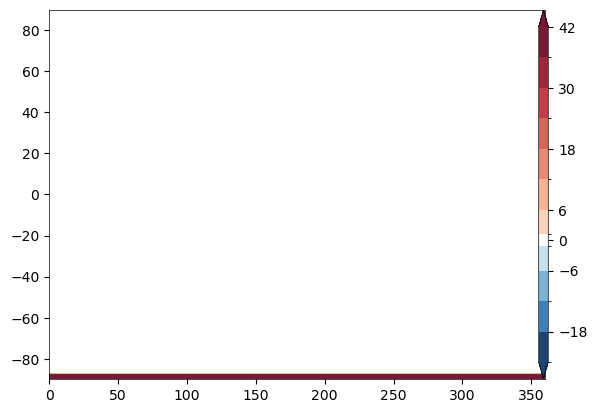

In [677]:
_,custom_levels_bar,cs=plot_contourf_near0_fixcolorbar(x, y, zz, cbar_lim = [-20, 40]) # ,my_cmap = 'BlueYellowRed'
cbar_ax = plt.gcf().add_axes([0.89, 0.111, 0.015, 0.768])
cb = plt.colorbar(mappable = cs, cax=cbar_ax, spacing="proportional")

In [678]:
selected_u_wind.shape

(64, 128)

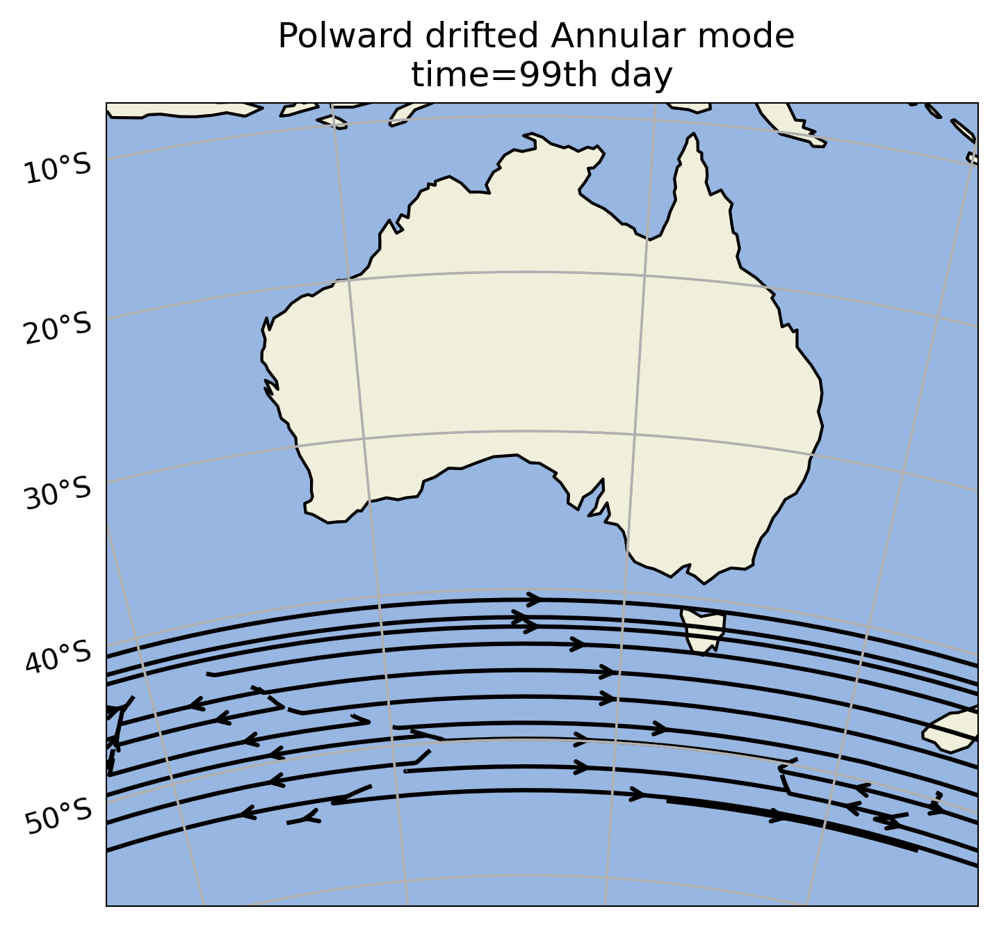

In [692]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import matplotlib.ticker as mticker
    
# Sample longitude and latitude arrays
# Modify these arrays based on the actual range and resolution of your data
lons = np.linspace(0, 360, 128, endpoint=False)  # Adjust to your grid's actual longitude range
lats = np.linspace(-90, 90, 64)     # Adjust to your grid's actual latitude range

# Create a meshgrid for plotting
lon2d, lat2d = np.meshgrid(cyclic_longitude, lats)

central_lat = -23.
central_lon = 132.
extent = [106, 160, -60, -8]
central_lon = np.mean(extent[:2])
central_lat = np.mean(extent[2:])

# Assuming your u_wind data is already loaded with dimensions (100, 20, 64, 128)
# Select the first time step and the first vertical level
for t in range(99,100,1):
    selected_u_wind = np.nanmean(u_demo[t, :, :, :], axis=0)  # Adjust indices if needed for other time steps or levels
    # selected_u_wind = u_demo[t, 5, :, :]  # Adjust indices if needed for other time steps or levels
    cyclic_data, cyclic_longitude = add_cyclic_point(selected_u_wind, coord=lons, axis=-1)

    
    # Set up the figure and GeoAxes for plotting
    fig = plt.figure(figsize=(10, 5), dpi=300.)
    # ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=138, central_latitude=-30))
    # ax = fig.add_subplot(1, 1, 1, projection=ccrs.Geostationary(central_longitude=134.0, satellite_height=35785831/3, false_easting=160, false_northing=100000, globe=None))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.AlbersEqualArea(central_latitude=0,
                         false_easting=0, 
                         false_northing=0, 
                         central_longitude=132, 
                         standard_parallels=(-18, -36) ))
    ax.set_extent(extent)
    

    # ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    
    
    # Configure the GeoAxes to display a globe
    # ax.set_global()
    ax.coastlines(alpha=0.3)
    
    # norm = mcolors.TwoSlopeNorm(vmin=d.min(), vcenter=0, vmax = d.max())
    # Plot the u wind as a contour plot
    # wind_plot = ax.contourf(lon2d, lat2d, selected_u_wind, levels=51, extend="both", transform=ccrs.PlateCarree(), cmap='RdBu_r')
    # wind_plot = ax.contourf(cyclic_longitude, lats, cyclic_data, levels=np.linspace(-20,40,51), extend="both", transform=ccrs.PlateCarree(), cmap='RdBu_r')

    index_S = 12 # 16-23
    index_N = 20
    density = 2
    
    ax.streamplot(cyclic_longitude, lats[index_S:index_N:density], cyclic_data[index_S:index_N:density,:], np.zeros(cyclic_data[index_S:index_N:density,:].shape), transform=ccrs.PlateCarree(), color="Black", broken_streamlines=False, arrowstyle="->")
    # ax.quiver(cyclic_longitude[::4], lats[40:50:4], cyclic_data[40:50:4,::4], np.zeros(cyclic_data[40:50:4,::4].shape), 
    #                         width=0.0045 ,headaxislength=3,headlength=6,headwidth=4,
    #                         scale=500, color="Black", transform=ccrs.PlateCarree())
    
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAND, edgecolor='black')
    ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
    ax.add_feature(cartopy.feature.RIVERS)
    ax.gridlines()

    
    # plt.title(f'equtorward_drifted drifted Annular mode')
    plt.title(f'Polward drifted Annular mode \ntime={t}th day')
    
    # Add a color bar
    # cbar_ax = plt.gcf().add_axes([0.75, 0.111, 0.015, 0.768])
    # cb = plt.colorbar(mappable = cs, cax=cbar_ax, spacing="proportional")
    # cb.ax.set_title("[m/s]", fontsize=8)

    # ax.gridlines(crs=ccrs.PlateCarree(), linewidth=2, color='black', alpha=0.3, linestyle='--', draw_labels=True ,x_inline=False, y_inline=True, ylocs=[-40,-30,0])

    


    gl = ax.gridlines(draw_labels=True,x_inline=False,y_inline=False, crs=ccrs.PlateCarree())
    # gl.xlocator = mticker.FixedLocator([-45, -30,-15])
    # gl.ylocator = mticker.FixedLocator([55, 60])
    gl.bottom_labels = False
    gl.left_labels   = True
    gl.top_labels    = False
    gl.right_labels  = False

        # Display the plot
    plt.savefig(f"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/visualization_Annular_mode/Australia/Poleward_drifted/99.png", dpi=600., bbox_inches='tight')
    # plt.close()
plt.show()



/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_rivers_lake_centerlines.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)

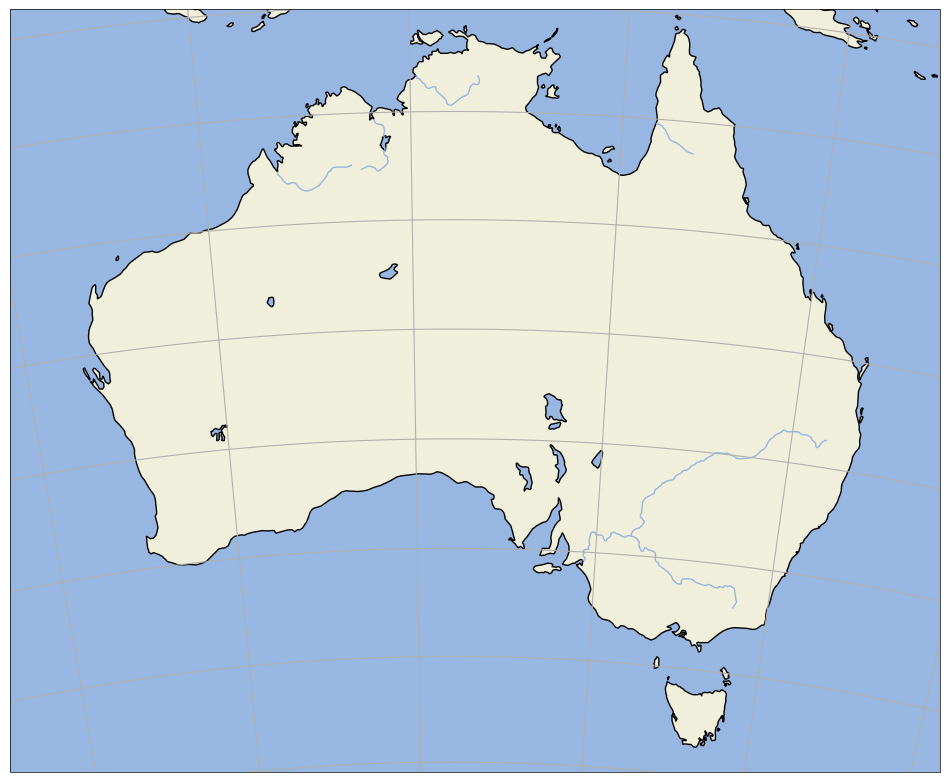

In [609]:
import cartopy.feature as cfeature
import numpy as np

central_lat = -23.
central_lon = 132.
extent = [112, 154, -44, -9]
central_lon = np.mean(extent[:2])
central_lat = np.mean(extent[2:])

albo = ccrs.AlbersEqualArea(central_latitude=0,
 false_easting=0, 
 false_northing=0, 
 central_longitude=132, 
 standard_parallels=(-18, -36) )

plt.figure(figsize=(12, 10))
ax = plt.axes(projection=albo)
ax.set_extent(extent)

ax.add_feature(cartopy.feature.OCEAN)
ax.add_feature(cartopy.feature.LAND, edgecolor='black')
ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
ax.add_feature(cartopy.feature.RIVERS)
ax.gridlines()

In [582]:
lats[18:26]

array([-38.57142857, -35.71428571, -32.85714286, -30.        ,
       -27.14285714, -24.28571429, -21.42857143, -18.57142857])

In [ ]:
# import matplotlib.pyplot as plt
# import cartopy.crs as ccrs
# from cartopy.util import add_cyclic_point
# import matplotlib.colors as mcolors

# # Assuming your u_wind data is already loaded with dimensions (100, 20, 64, 128)
# # Sample longitude and latitude arrays
# lons = np.linspace(-180, 180, 128)  # Adjust to your grid's actual longitude range
# lats = np.linspace(-90, 90, 64)     # Adjust to your grid's actual latitude range

# # Select the first time step and the first vertical level
# for t in range(88, 89):
#     selected_u_wind = np.nanmean(u_demo[t, :, :, :], axis=0)  # Averaging over vertical levels
#     cyclic_data, cyclic_longitude = add_cyclic_point(selected_u_wind, coord=lons)

#     # Create a meshgrid for plotting
#     lon2d, lat2d = np.meshgrid(cyclic_longitude, lats)

#     # Set up the figure and GeoAxes for plotting
#     fig = plt.figure(figsize=(10, 5))
#     ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=0, central_latitude=-90))
#     ax.set_global()
#     ax.coastlines()

#     # Normalization for color scaling
#     norm = mcolors.TwoSlopeNorm(vmin=selected_u_wind.min(), vcenter=0, vmax=selected_u_wind.max())
    
#     # Plot the u wind as a contour plot
#     wind_plot = ax.contourf(lon2d, lat2d, cyclic_data, levels=51, extend="both", transform=ccrs.PlateCarree(), cmap='RdBu_r', norm=norm)
    
#     plt.title(f'[u] time = {t}th day')
    
#     # Add a color bar
#     cbar_ax = plt.gcf().add_axes([0.73, 0.111, 0.015, 0.768])
#     cb = plt.colorbar(mappable=wind_plot, cax=cbar_ax, spacing="proportional")
#     cb.ax.set_title("m/s", fontsize=8)
    
#     plt.show()

In [93]:
print(selected_u_wind.min())


-35.36412448157906


In [33]:
print(u_demo.shape)

(100, 20, 64, 128)


In [255]:
x_demo = np.linspace(0,360,128)
y_demo = np.linspace(-90,90,64)
x_demo2, y_demo2 = np.meshgrid(x_demo, y_demo)
                               

In [274]:
plt.figure()
# fig = plt.figure(figsize=(10, 5), dpi=300.)
# ax = fig.add_subplot(1, 1, 1, projection=ccrs.AzimuthalEquidistant(central_longitude=0, central_latitude=-90))
# ax = fig.add_subplot(1, 1, 1, projection=ccrs.AzimuthalEquidistant())
ax.contourf(x_demo2, y_demo2, u_demo[0,5,:,:], levels=11, transform=ccrs.PlateCarree())
# p.xlabel("Longitude")
# plt.ylabel("Latitude")


<Figure size 640x480 with 0 Axes>

In [275]:
plt.figure()
plt.contourf(yy, sigma_mean2, np.nanmean(u_demo, axis=(0,3)))

NameError: name 'sigma_mean2' is not defined

<Figure size 640x480 with 0 Axes>

# Fig.1

# tmp

In [707]:
# qv, qv_diff, u, v, t, p, ps, p_half = read_all_var(pr_start, pr_to, pr_leap, start , end, internal_day, total_file)  # 
# print("done")

In [16]:
# # ### read PR0 variables ###
# qv_diff_file0 = h5py.File("PR0_0_20000day_qv_diff.h5", "r")
# p_half_file0  = h5py.File("PR0_0_20000day_p_half.h5", "r")

# qv_diff_origin0 = np.asarray(qv_diff_file0["qv_diff"][:,int(start):end,:,:,:])
# p_half_origin0  = np.asarray(p_half_file0["p_half"][:,int(start):end,:,:,:])


In [17]:
# # ### read variables ###
# # u_file       = h5py.File("PR10_50_0_20000day_u.h5", "r")
# # w_file       = h5py.File("PR10_50_0_20000day_w.h5", "r")

# # qv_file      = h5py.File("PR10_50_0_20000day_qv.h5", "r")
# qv_diff_file = h5py.File("PR10_50_0_20000day_qv_diff.h5", "r")
# # p_file       = h5py.File("PR10_50_0_20000day_p.h5", "r")
# # ps_file      = h5py.File("PR10_50_0_20000day_ps.h5", "r")
# p_half_file  = h5py.File("PR10_50_0_20000day_p_half.h5", "r")

# # z_full_file  = h5py.File("PR10_50_0_20000day_z_full.h5", "r")



# # print("---1---")
# # u_origin       = np.asarray(u_file["u"][:,int(start):end,:,:,:])
# # print("---2---")
# qv_diff_origin = np.asarray(qv_diff_file["qv_diff"][:,int(start):end,:,:,:])
# # print("---3---")
# # p_origin       = np.asarray(p_file["p"][:,int(start):end,:,:,:])
# # print("---4---")
# # ps_origin      = np.asarray(ps_file["ps"][:,int(start):end,:,:,:])
# # print("---5---")
# p_half_origin  = np.asarray(p_half_file["p_half"][:,int(start):end,:,:,:])
# # print("---6---")

# # w_origin       = np.asarray(w_file["w"][:,int(start):end,:,:,:])
# # z_full_origin       = np.asarray(z_full_file["z_full"][:,int(start):end,:,:,:])


# # print("done")

# # u_file.close()
# # qv_file.close()
# # qv_diff_file.close()
# # p_file.close()
# # ps_file.close()
# # p_half_file.close()
# # w_file.close()
# # z_full_file.close()

# # v_file       = h5py.File("PR10_50_0_20000day_v.h5", "r")
# # v_origin       = np.asarray(v_file["v"][:,int(start):end,:,:,:])
# # t_file       = h5py.File("PR10_50_0_20000day_t.h5", "r")
# # t_origin       = np.asarray(t_file["t"][:,int(start):end,:,:,:])

# # v_file.close()
# # t_file.close()

# # print("done")



In [18]:
# # u = u_all[:,int(start):int(end),:,:]
# qv_diff = np.append(qv_diff_origin0, qv_diff_origin, axis=0)
# # p = p_origin
# # ps = ps_origin
# p_half = np.append(p_half_origin0, p_half_origin, axis=0)
# # w = w_origin
# # z_full = z_full_origin
# # v = v_origin
# # t = t_origin

In [19]:
# print(qv_diff.shape)

In [91]:
total_pr = int(total_pr)
boostrap_specific_level_check_05percentage = True

if boostrap_specific_level_check_05percentage:
        y_pr0 = 34.47084639498433 
        z_biggest_all = np.zeros(total_pr)
        z_biggest_all[0] = 0.2160804020100503
        z_biggest_all[1] = 0.2160804020100503
        z_biggest_all[2] = 0.2160804020100503
        z_biggest_all[3] = 0.21534170854271362
        z_biggest_all[4] = 0.1770502512562814
        z_biggest_all[5] = 0.16582914572864318


print(y_pr0)

34.47084639498433


In [92]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx], idx
# print(z_biggest_all)
# print(biggest_u_z_idx)

In [93]:
def calculate_prec(qv_diff, p_half):
    g = 9.81
    Prec = np.zeros(qv_diff.shape)
    for i in range(1, 20 - 1):
        Prec[:, i, :, :] = 1 / g * qv_diff[:, i, :, :] * (p_half[:, i + 1, :, :] - p_half[:, i, :, :])
    Prec[:, 0, :, :] = 1 / g * qv_diff[:, 0, :, :] * (p_half[:, 1, :, :] - p_half[:, 0, :, :])
    Prec_mean = np.nansum(Prec, axis=(1))
    Prec_mean_y = np.nanmean(Prec_mean, axis=(0, 2))
    return Prec_mean_y

def interpolate_data(u, sigma_onlyz, y, interpolation_times):
    yys = np.linspace(0, 90, 32 * interpolation_times)
    sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], u[:, 32:])
    u_thin = interp_spline(sigma_mean2s, yys)
    return u_thin, yys, cyy

# def plot_data(ax, y_data, data, control, label, color):
#     ax.plot(y_data, data / control, label=label, color=color)
#     ax.axhline(y=0, color='gray', lw=0.8)
#     ax.spines["right"].set_visible(False)
#     ax.spines["top"].set_visible(False)
#     ax.set_xlabel("Latitude", fontsize=8)
#     ax.legend()
#     ax.legend(prop={'size': 8})

def cal_EMF(u_prime, v_prime, sigma_mean, y, cyy, interpolation_times):  # Add cyy as a parameter
    Mzmtm = np.nanmean(u_prime * v_prime, axis=(0, 3))
    Mzmtm_thin, _, _ = interpolate_data(Mzmtm, sigma_mean, y, interpolation_times)
    Mzmtm_thin_w = Mzmtm_thin * cyy[np.newaxis, :] ** 0.5
    return Mzmtm_thin_w

def cal_EKE(u_prime, v_prime, sigma_mean, y, cyy, interpolation_times):
    eddy_kinatic_energy = 0.5 * np.nanmean((u_prime ** 2 + v_prime ** 2) ** 0.5, axis=(0, 3))
    EKE_thin, _, _ = interpolate_data(eddy_kinatic_energy, sigma_mean, y, interpolation_times)
    EKE_thin_w = EKE_thin * cyy[np.newaxis, :] ** 0.5
    return EKE_thin_w

def cal_EHF(Ttm, t_prime, v_prime, sigma_onlyz, y, cyy, interpolation_times):
    # t_prime = np.rollaxis((np.rollaxis(t, 3, 0) - np.nanmean(t, axis=3)), 0, 4)
    # b = t_prime / np.nanmean(t, axis=0) * 9.81
    b = t_prime / Ttm * 9.81
    
    eddy_flux_heat = np.nanmean(b * v_prime, axis=(0, 3))    
    eddy_flux_heat_thin, _, _ = interpolate_data(eddy_flux_heat, sigma_onlyz, y, interpolation_times)
    eddy_flux_heat_thin_w = eddy_flux_heat_thin * cyy[np.newaxis, :] ** 0.5
    return eddy_flux_heat_thin_w





In [94]:
EMF_file0      = h5py.File("PR0_500_20000day_EMF.h5", "r")
EKE_file0      = h5py.File("PR0_500_20000day_EKE.h5", "r")
EHF_file0      = h5py.File("PR0_500_20000day_EHF.h5", "r")
prec_file0     = h5py.File("PR0_500_20000day_precipitation.h5", "r")


EMF0       = np.asarray(EMF_file0["EMF"][:,:,:])
EKE0       = np.asarray(EKE_file0["EKE"][:,:,:])
EHF0       = np.asarray(EHF_file0["EHF"][:,:,:])
Prec0      = np.asarray(prec_file0["precipitation"][:])

In [95]:
EMF_file      = h5py.File("PR10_50_500_20000day_EMF.h5", "r")
EKE_file      = h5py.File("PR10_50_500_20000day_EKE.h5", "r")
EHF_file      = h5py.File("PR10_50_500_20000day_EHF.h5", "r")
prec_file     = h5py.File("PR10_50_500_20000day_precipitation.h5", "r")


EMF1       = np.asarray(EMF_file["EMF"][:,:,:])
EKE1       = np.asarray(EKE_file["EKE"][:,:,:])
EHF1       = np.asarray(EHF_file["EHF"][:,:,:])
Prec1      = np.asarray(prec_file["precipitation"][:])





In [96]:
EMF = np.append(EMF0, EMF1, axis=0)
EKE = np.append(EKE0, EKE1, axis=0)
EHF = np.append(EHF0, EHF1, axis=0)
Prec = np.append(Prec0, Prec1, axis=0)




In [97]:
def main():
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    import numpy as np
    from scipy.interpolate import RectBivariateSpline
    import matplotlib as mpl  # Add this line
    a = 0  # Initialize variable 'a'
    interpolation_times = 10
    
    # Define control variables
    EMF_control = None
    EKE_control = None
    EHF_control = None

    pr_file = int((pr_to - pr_start) / pr_leap)

    # Compute cyy
    yys = np.linspace(0, 90, 32 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    
    fig, ax = plt.subplots(3, 2, figsize=(10, 9), dpi=300.)
    mpl.rcParams['axes.linewidth'] = 0.5

    # colors
    rgb=([112,115,115])
    rgb=np.array(rgb)/255.0
    icmap=colors.ListedColormap(rgb,name='my_color')
    cmap=mpl.cm.viridis
    
    cmap_color=icmap  
    # bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
    colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255 # By Nick
    # colors = np.array([[112,115,115],[137,209,201], [18,78,120], [242,187,5],[215,78,9],[255,16,7]])/255
    

    EMF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EHF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    u_zy_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EKE_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    Prec_check     = np.zeros((pr_file, 64))
    
    for pr in range(pr_start, pr_to, pr_leap):
        # sigma coord.
        check_days_length = int(end-start)
        sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
        sigma_onlyz = np.nanmean(sigma_mean, axis=1)
        y = np.linspace(-90, 90, 64)
        yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)
    
        sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
        
        u_zy = np.nanmean(Uzm[a], axis=(0))
        
        u_zy_thin, yys, cyy = interpolate_data(u_zy, sigma_onlyz, y, interpolation_times)

        biggest_u_y, biggest_u_y_idx = find_nearest(yys, value=y_pr0)
        biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[int(pr / pr_leap)])
        print(biggest_u_z_idx)

        EMF_check[a, :, :]      = EMF[a] # cal_EMF(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EKE_thin_check[a, :, :] = EKE[a] # cal_EKE(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EHF_check[a, :, :]      = EHF[a] # cal_EHF(Ttm[a], t_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)

        Prec_check[a] = Prec[a] # calculate_prec(qv_diff[a], p_half[a])
        if a == 0:
            u_control   = np.nanmax(u_zy_thin[biggest_u_z_idx,:])
            EMF_control = np.nanmax(EMF_check[a,biggest_u_z_idx,:])
            EHF_control = np.nanmax(EHF_check[a,165,:])
            EKE_control = np.nanmax(EKE_thin_check[a,biggest_u_z_idx,:])
            
        
        # Plot u_zy_thin
        ax[0, 0].plot(yys, u_zy_thin[biggest_u_z_idx, :]/u_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[0, 0].set_title("u")
        
        # Plot EMF_check
        ax[1, 0].plot(yys, EMF_check[a, biggest_u_z_idx, :]/EMF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 0].set_title("EMF")

        # Plot EKE_thin_check
        ax[2, 0].plot(yys, EKE_thin_check[a, biggest_u_z_idx, :]/EKE_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 0].set_title("EKE")

        # Plot EHF_check
        ax[1, 1].plot(yys, EHF_check[a, 165, :]/EHF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 1].set_title("EHF")
            
        # Plot Prec_mean_y
        ax[2, 1].plot(y, Prec_check[a, :], label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 1].set_title("Precipitation [mm/day]")
        

        a += 1

    for i in range(3):
        for j in range(2):
            ax[i, j].vlines(y_pr0, ymin=-0,ymax=1, colors=colors[0])
            ax[i, j].axhline(y=0, color='gray', lw=0.8)
            ax[i, j].spines["right"].set_visible(False)
            ax[i, j].spines["top"].set_visible(False)
            ax[i, j].set_xlabel("Latitude", fontsize=8)
            # ax[i, j].legend()
    ax[0, 0].legend(prop={'size': 8})
    plt.suptitle("500-20000day rescale by L=0 max", fontsize=16)
    plt.tight_layout()
    # plt.savefig("Nick_paper_fig1.png", dpi=600., bbox_inches='tight')
    # plt.savefig("Nick_paper_fig1_rescale_by_L=0_max.png", dpi=600., bbox_inches='tight')
    
    plt.show()

    return EMF_check, EKE_thin_check, EHF_check, Prec_check

43
43
43
43
35
33


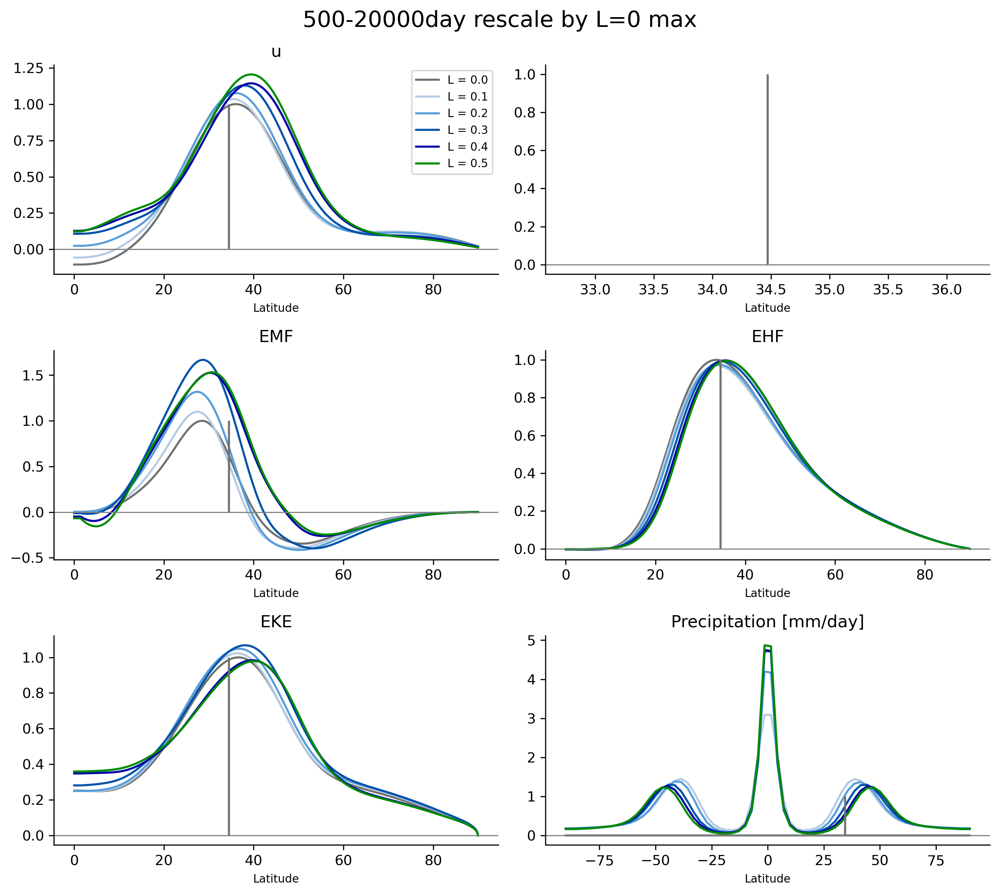

(6, 200, 320)
(6, 200, 320)
(6, 200, 320)


In [22]:
EMF_check, EKE_thin_check, EHF_check, Prec_check = main()
print(EMF_check.shape)
print(EKE_thin_check.shape)
print(EHF_check.shape)


In [160]:
def main_all_level_integration():
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    import numpy as np
    from scipy.interpolate import RectBivariateSpline
    import matplotlib as mpl  # Add this line
    a = 0  # Initialize variable 'a'
    interpolation_times = 10
    
    # Define control variables
    EMF_control = None
    EKE_control = None
    EHF_control = None

    pr_file = int((pr_to - pr_start) / pr_leap)

    # Compute cyy
    yys = np.linspace(0, 90, 32 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    
    # fig, ax = plt.subplots(3, 2, figsize=(10, 9), dpi=300.)
    ####
    fig = plt.figure(figsize=(10, 5), dpi=600.)
    mpl.rcParams['axes.linewidth'] = 1.2

    spec = mpl.gridspec.GridSpec(ncols=6, nrows=2) # 6 columns evenly divides both 2 & 3
    
    ax1 = fig.add_subplot(spec[0,0:2]) # row 0 with axes spanning 2 cols on evens
    ax2 = fig.add_subplot(spec[0,2:4])
    ax3 = fig.add_subplot(spec[0,4:])
    ax4 = fig.add_subplot(spec[1,1:3]) # row 0 with axes spanning 2 cols on odds
    ax5 = fig.add_subplot(spec[1,3:5])
    ####
    # colors
    rgb=([112,115,115])
    rgb=np.array(rgb)/255.0
    icmap=colors.ListedColormap(rgb,name='my_color')
    cmap=mpl.cm.viridis
    
    cmap_color=icmap  
    # bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
    colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255 # Nick
    # colors = np.array([[112,115,115],[202,240,248],[114,224,239],[0,180,216],[0,119,182],[90, 24, 154]])/255 # 44, 7, 53
    
    

    EMF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EHF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    u_zy_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EKE_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    Prec_check     = np.zeros((pr_file, 64))
    
    for pr in range(pr_start, pr_to, pr_leap):
        # sigma coord.
        check_days_length = int(end-start)
        sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
        sigma_onlyz = np.nanmean(sigma_mean, axis=1)
        y = np.linspace(-90, 90, 64)
        yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)
    
        sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
        
        u_zy = np.nanmean(Uzm[a], axis=(0))
        
        u_zy_thin, yys, cyy = interpolate_data(u_zy, sigma_onlyz, y, interpolation_times)

        biggest_u_y, biggest_u_y_idx = find_nearest(yys, value=y_pr0)
        biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[int(pr / pr_leap)])
        print(biggest_u_z_idx)

        EMF_check[a, :, :]      = EMF[a] # cal_EMF(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EKE_thin_check[a, :, :] = EKE[a] # cal_EKE(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EHF_check[a, :, :]      = EHF[a] # cal_EHF(Ttm[a], t_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)

        Prec_check[a] = Prec[a] # calculate_prec(qv_diff[a], p_half[a])
        if a == 0:
            u_control   = np.nanmax(np.nanmean(u_zy_thin[:,:],axis=0))
            EMF_control = np.nanmax(np.nanmean(EMF_check[a,:,:], axis=0))
            EHF_control = np.nanmax(np.nanmean(EHF_check[a,:,:], axis=0))
            EKE_control = np.nanmax(np.nanmean(EKE_thin_check[a,:,:], axis=0))
            
        
        # Plot u_zy_thin
        ax1.plot(yys, np.nanmean(u_zy_thin[:, :], axis=0)/u_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax1.set_title("a) [u]", loc="left")
        
        # Plot EMF_check
        ax2.plot(yys, np.nanmean(EMF_check[a, :, :], axis=0)/EMF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax2.set_title("b) [EMF]", loc="left")

        # Plot EKE_thin_check
        ax3.plot(yys, np.nanmean(EKE_thin_check[a, :, :], axis=0)/EKE_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax3.set_title("c) [EKE]", loc="left")

        # Plot EHF_check
        ax4.plot(yys, np.nanmean(EHF_check[a, :, :], axis=0)/EHF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax4.set_title("d) [EHF]", loc="left")
            
        # Plot Prec_mean_y
        ax5.plot(y, Prec_check[a, :], label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax5.set_title("e) [P]", loc="left")
        

        a += 1
    
    # for i in range(3):
        # for j in range(2):
    # ax1
    ax1.vlines(y_pr0, ymin=-0,ymax=1, colors="black", linewidth=0.5)
    ax1.axhline(y=0, color="black", lw=0.5)
    ax1.spines["right"].set_visible(False)
    ax1.spines["top"].set_visible(False)
    ax1.set_xlabel("Latitude", fontsize=12)
    ax1.legend(prop={'size': 8})
    ax1.set_yticks(np.arange(0,1.5,0.25))

    # ax2
    ax2.vlines(y_pr0, ymin=-0,ymax=1, colors="black", linewidth=0.5)
    ax2.axhline(y=0, color="black", lw=0.5)
    ax2.spines["right"].set_visible(False)
    ax2.spines["top"].set_visible(False)
    ax2.set_xlabel("Latitude", fontsize=12)
    ax2.set_yticks(np.arange(0,2.0,0.5))

    # ax3
    ax3.vlines(y_pr0, ymin=-0,ymax=1, colors="black", linewidth=0.5)
    ax3.axhline(y=0, color="black", lw=0.5)
    ax3.spines["right"].set_visible(False)
    ax3.spines["top"].set_visible(False)
    ax3.set_xlabel("Latitude", fontsize=12)
    ax3.set_yticks(np.arange(0,1.25,0.25))

    # ax4
    ax4.vlines(y_pr0, ymin=-0,ymax=1, colors="black", linewidth=0.5)
    ax4.axhline(y=0, color="black", lw=0.5)
    ax4.spines["right"].set_visible(False)
    ax4.spines["top"].set_visible(False)
    ax4.set_xlabel("Latitude", fontsize=12)
    ax4.set_yticks(np.arange(0,1.25,0.25))

    # ax5
    ax5.vlines(y_pr0, ymin=-0,ymax=1, colors="black", linewidth=0.5)
    ax5.axhline(y=0, color="black", lw=0.5)
    ax5.spines["right"].set_visible(False)
    ax5.spines["top"].set_visible(False)
    ax5.set_xlabel("Latitude", fontsize=12)
    ax5.set_ylabel("mm/day", fontsize=8)
    ax5.set_yticks(np.arange(0,6,1))
    ax5.set_xticks(np.arange(-75,100,25))

    
    plt.suptitle("500-20000day all level integration rescale by each L=0 max", fontsize=16)
    plt.tight_layout()
    # plt.savefig("Nick_paper_fig1.png", dpi=600., bbox_inches='tight')
    # plt.savefig("Nick_paper_fig1_all level integration_rescale_by_each_L_max.png", dpi=600., bbox_inches='tight')
    # plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig//fig1_all level integration_rescale_by_each_L_0.png", dpi=600., bbox_inches='tight')
    plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar//fig1_all level integration_rescale_by_each_L_0.png", dpi=600., bbox_inches='tight')
    
    
    plt.show()

    return EMF_check, EKE_thin_check, EHF_check, Prec_check

43
43
43
43
35
33


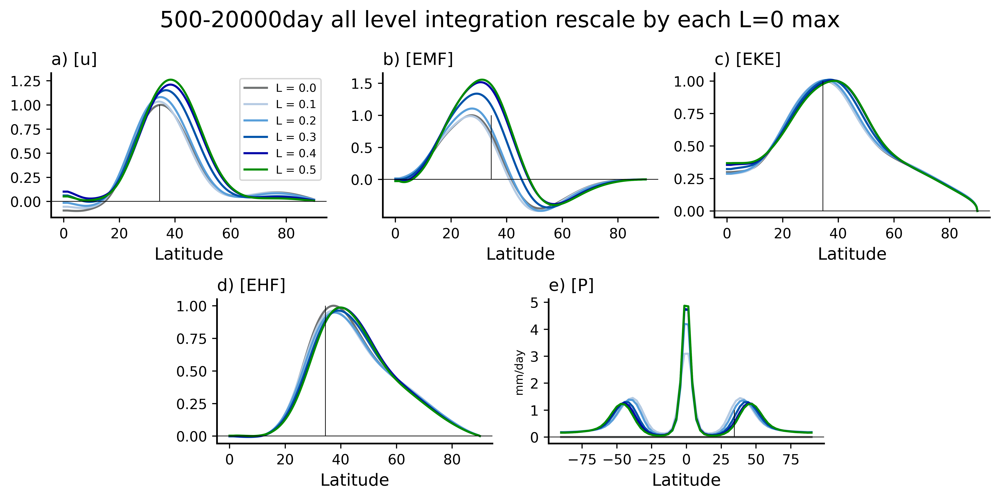

In [161]:
EMF_check, EKE_thin_check, EHF_check, Prec_check = main_all_level_integration()


In [152]:
# with h5py.File('PR10_50_500_20000day_EMF.h5','w') as EMF_file :
#     EMF_file.create_dataset('EMF',data=EMF_check)

# with h5py.File('PR10_50_500_20000day_EKE.h5','w') as EKE_file :
#     EKE_file.create_dataset('EKE',data=EKE_thin_check)

# with h5py.File('PR10_50_500_20000day_EHF.h5','w') as EHF_file :
#     EHF_file.create_dataset('EHF',data=EHF_check)

# print("EMF, EKE, and EHF saving done")

## U y-z profile checking boostrap correction

In [95]:
# print(sigma_mean.shape)

(20, 64, 128)


NameError: name 'Pszm' is not defined

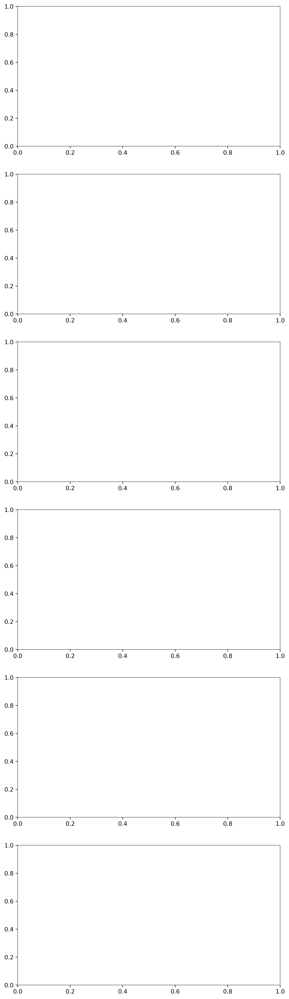

In [285]:
# import matplotlib as mpl  # Add this line

# fig,ax = plt.subplots(6, figsize=(8,30), dpi=300.)
# mpl.rcParams['axes.linewidth'] = 0.5

# check_days_length = int(end-start)

# a = 0
# for i in range(10, 60, 10):
#     sigma_mean = np.nanmean(p[a,-check_days_length:, :, :, :] / ps[a,-check_days_length:, :, :, :], axis=(0, 3))
#     sigma_onlyz = np.nanmean(sigma_mean, axis=1)
#     y = np.linspace(-90, 90, 64)
#     yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)

#     # biggest_u_y, biggest_u_y_idx = find_nearest(yy, value=y_pr0)
#     # print(z_biggest_all[a])
#     # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2, value=z_biggest_all[a])
#     # print(biggest_u_z)
#     CS = ax[a].contourf(yy, sigma_mean2, np.nanmean(u[a], axis=(0,3)), levels=np.linspace(-30,50,21))
#     plt.colorbar(CS, ax=ax[a])
    
#     ax[a].hlines(z_biggest_all[a], xmin=-90, xmax=90)
    
#     ax[a].set_ylim([1,0])
#     a += 1

# t test

In [241]:
# def cal_self_Martin_et_al_1999(window_length, r1):
#     """
#     T : window length
#     r1: lag one autocorrelation of data1
#     """
#     final = window_length * ( (1-r1[1]) / (1+r1[1]) )
#     return final

# def cal_cross_dof_Martin_et_al_1999(T, r1, r2):
#     """
#     T : window length
#     r1: lag one autocorrelation of data1
#     r2: lag one autocorrelation of data2
#     """
#     final = np.zeros(T)
#     a = 0
#     for i in range(T, 0, -1):
#         final[i] = i * ( (1-r1[1]*r2[1]) / (1+r1[1]*r2[1]) )
#         a += 1
#     return final

# def autocorr1(x,lags):
#     corr = np.zeros(int(lags))
#     for l in range(lags):
#         if l == 0:
#             corr[l] = 1.
#         else:
#             corr[l] = np.corrcoef(x[l:],x[:-l])[0][1]
#     # corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in range(lags)]
#     return np.array(corr)

# from scipy import stats
# import math
# def run_t_test(data1, data2, dof1, dof2):
    
#     # mean
#     data1_mean, data2_mean = np.nanmean(data1), np.nanmean(data2)
#     # standard deviation
#     data1_sd, data2_sd = np.std(data1), np.std(data2)

#     # std^2 / dof
#     std_dof = ( ((data1_sd**2) / dof1) + ((data2_sd**2) / dof2) )**0.5

#     # t-stat
#     t_stat = (data1_mean - data2_mean) / ( std_dof )

#     # std error
#     std_error1 =  data1_sd / np.sqrt(dof1)
#     std_error2 =  data2_sd / np.sqrt(dof2)
    
#     # critical value
#     alpha = 0.1
#     lower_cv1 =  stats.t.ppf(alpha/2      , dof1) #* std_error1
#     high_cv1  =  stats.t.ppf(1.0 - alpha/2, dof1) #* std_error1
#     # print(lower_cv1)

#     # lower_cv1 =  data1_mean - 1.96 * data1_sd / dof1**0.5 
#     # high_cv1  =  data1_mean + 1.96 * data1_sd / dof1**0.5 
    
    
#     # t_test, _ = stats.ttest_rel(data1, data2)
    
#     return t_stat, lower_cv1, high_cv1, _

In [ ]:
# EOF1 = np.zeros(((total_pr, 20, 32)))
# EOF2 = np.zeros(((total_pr, 20, 32)))

# PC1 = np.zeros((total_pr, total_day))
# PC2 = np.zeros((total_pr, total_day))

# explained_all = np.zeros((total_pr, 10))
# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     # EOF1[a], PC1_all[a], EOF2[a], PC2_all[a] = Cal_EOF_PC(EOF, np.nanmean(u[a], axis=(3)))
#     EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])
    
#     a += 1
# print("EOF done")

a= 0
a= 1
a= 2
a= 3
a= 4


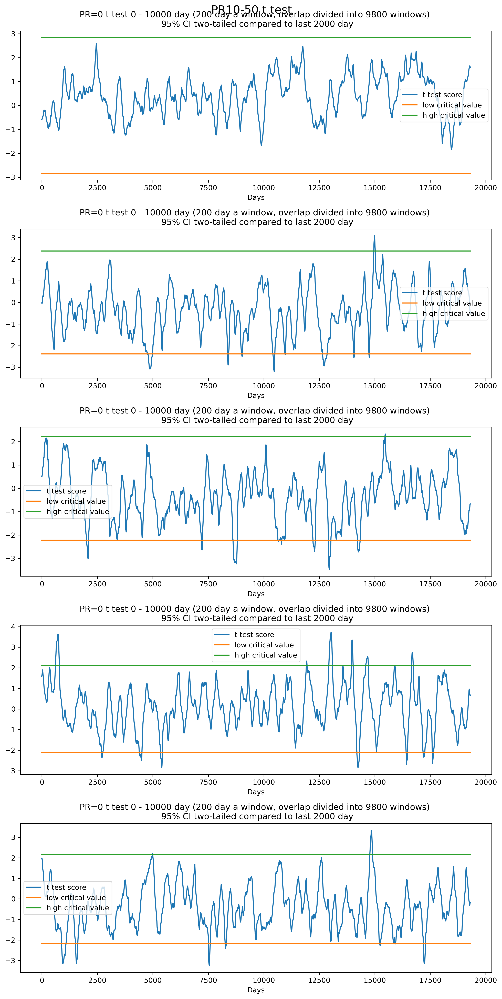

In [246]:
# window_length = 200
# auto_length = 2

# a = 0

# ### all 9500 day do overlap window 
# # PC1_window     = np.zeros((( u.shape[0], int(u.shape[1]/window_length), window_length )))
# # overlap version
# PC1_window      = np.zeros((( total_pr, int(total_day-window_length), window_length )))

# test_stat_all   = np.zeros(( total_pr, PC1_window.shape[1]))
# pvalue_all      = np.zeros(( total_pr, PC1_window.shape[1]))
# cv_all          = np.zeros(( total_pr, PC1_window.shape[1]))

# dof             = np.zeros(( total_pr, int(total_day-window_length)  ))
# window_day_auto = np.zeros((( total_pr, int(total_day-window_length), auto_length )))

# for pr in range(pr_start, pr_to, pr_leap):
#     k = 0
#     for i in range(0, total_day-window_length):
#         # Step 1. Divide PC1 into 100 day window, so I got 9500/100 = 95 windows
#         PC1_window[a,k,:] = (PC1[a,i:i+window_length])
#         k += 1

#     # Step 2. cal autocorrelation
#     last_window_day_auto         = autocorr1(PC1_window[a,-1,:], auto_length)
#     for i in range(PC1_window.shape[1]):
#         window_day_auto[a,i,:]   = autocorr1(PC1_window[a,i,:], auto_length) 

#         # Step 3. cal dof (degree of freedom)
#         dof[a,i]          = cal_self_Martin_et_al_1999(window_length, window_day_auto[a,i,:])
        
#     # print(test_stat)
    
#     a += 1

# # dof_2000 = np.zeros(2000)
# a = 0
# PC1_2000_auto = np.zeros(( total_pr, auto_length ))
# for pr in range(pr_start, pr_to, pr_leap):
#     PC1_2000_auto[a,:]   = autocorr1(PC1[a,-2000:], auto_length)
#     a += 1

# dof_2000 = np.zeros( total_pr )
# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     dof_2000[a] = cal_self_Martin_et_al_1999(window_length, PC1_2000_auto[a,:])
#     a += 1

# t_score_all = np.zeros(( total_pr, int(total_day-window_length) ))
# t_test_all  = np.zeros(( total_pr, int(total_day-window_length) ))

# cv_low_all  = np.zeros(( total_pr, int(total_day-window_length) ))
# cv_high_all = np.zeros(( total_pr, int(total_day-window_length) ))

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     if a <5:
#         for i in range(PC1_window.shape[1]):
#             ####################### PC1_window
#             t_score, low_cv, high_cv, _ = run_t_test(PC1[a,-2000:], PC1_window[a,i,:], dof_2000[a], dof[a,i])
#             # print(t_score)
#             # print(cv)
            
#             t_score_all[a,i] = t_score
#             # t_test_all[a,i]  = t_test
#             cv_low_all[a,i]  = low_cv
#             cv_high_all[a,i] = high_cv
            
#             # print(i)
#         a += 1

# a = 0
# fig, ax = plt.subplots(total_pr, figsize=(10,20), dpi=300.)
# for pr in range(pr_start, pr_to, pr_leap):

#     ax[a].plot(t_score_all[a, :], label="t test score")
#     # plt.plot(t_test_all[a, ], label="t test score")
    
#     ax[a].plot(cv_low_all[a], label="low critical value")
#     ax[a].plot(cv_high_all[a], label="high critical value")
    
#     ax[a].set_title(f"PR=0 t test 0 - 10000 day ({window_length} day a window, overlap divided into {10000-window_length} windows) \n 95% CI two-tailed compared to last 2000 day")
#     ax[a].set_xlabel("Days")
#     ax[a].legend()
#     print("a=", a)
#     a += 1
# plt.suptitle("PR10-50 t test", fontsize=16)
# plt.tight_layout()
# # plt.savefig("PR10_50_t_test.png", dpi=600., bbox_inches='tight')


In [247]:
# Uzm.shape

(5, 19500, 20, 64)

In [63]:
# print(dof.shape)
# print(last_window_day_auto.shape)
# print(window_day_auto.shape)
# print(PC1_window.shape)
# print(PC1_all.shape)


(5, 19500)
(2,)
(5, 19500, 2)
(5, 19500, 500)
(5, 20000)


# Fig.2 EOF corelated

## specific level EOF

In [162]:

sigma_onlyz_all = np.zeros((total_pr, 20))
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # sigma coord.
    check_days_length = int(end-start)
    sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
    sigma_onlyz = np.nanmean(sigma_mean, axis=1)
    y = np.linspace(-90, 90, 64)
    yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)

    # sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
    sigma_onlyz_all[a] = sigma_onlyz
    a += 1
    
# with h5py.File('PR0_50_500_20000day_sigma_onlyz.h5','w') as sigma_onlyz_file :
#     sigma_onlyz_file.create_dataset('sigma_onlyz',data=sigma_onlyz_all)
# test_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
# sigma_onlyz       = np.asarray(test_file["sigma_onlyz"][:,:])

In [163]:
# print(sigma_onlyz_all.shape)

In [164]:
def Cal_EOF_PC(input_data):
    from EOF import EOF
    
    # Perform latitude weighting
    input_data_weighted = input_data * np.sqrt(np.cos(np.deg2rad(np.linspace(0, 90, input_data.shape[2]))))

    # Initialize an EOF instance with weighted input data
    n_component = min(input_data.shape[0], input_data.size // input_data.shape[0])

    print("n_component:", n_component)
    eof_instance = EOF((input_data_weighted,), n_components=n_component, field="2D")
    
    # Compute EOFs and PCs
    eof_instance.get()
    
    # Retrieve EOFs and PCs and Extract EOF1, PC1, EOF2, and PC2
    EOF1, EOF2 = eof_instance.EOF[:2]
    PC1, PC2 = eof_instance.PC[:2]

    # Normalize PCs and EOFs
    PC1_norm, PC2_norm = PC1 / PC1.std(), PC2 / PC2.std()
    EOF1_norm, EOF2_norm = EOF1 * PC1.std(), EOF2 * PC2.std()
    
    return EOF1_norm.reshape(20,32), PC1_norm, EOF2_norm.reshape(20,32), PC2_norm, eof_instance.explained[:10]

In [105]:
EOF1 = np.zeros(((total_pr, 20, 32)))
EOF2 = np.zeros(((total_pr, 20, 32)))

PC1 = np.zeros((total_pr, total_day))
PC2 = np.zeros((total_pr, total_day))

explained_all = np.zeros((total_pr, 10))

interpolation_times = 10
EOF1_all_thin = np.zeros(((total_pr, 20*interpolation_times, 32*interpolation_times)))
EOF2_all_thin = np.zeros(((total_pr, 20*interpolation_times, 32*interpolation_times)))

# sigma coord.
sigma_onlyz_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
sigma_onlyz_all       = np.asarray(sigma_onlyz_file["sigma_onlyz"][:,:])

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # cal EOF and PC
    # EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])
    EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:])
    
    
    # do interpolation
    sigma_mean2s = np.linspace(0,1,20*interpolation_times)
    yys          = np.linspace(0,90,32*interpolation_times)
    interp_spline = RectBivariateSpline(sigma_onlyz_all[a], y[32:], EOF1[a,:,:])
    EOF1_all_thin[a,:,:] = interp_spline(sigma_mean2s, yys)

    interp_spline = RectBivariateSpline(sigma_onlyz_all[a], y[32:], EOF2[a,:,:])
    EOF2_all_thin[a,:,:] = interp_spline(sigma_mean2s, yys)
    a += 1
print("done")

n_component: 640
n_component: 640
n_component: 640
n_component: 640
n_component: 640
n_component: 640
done


In [106]:
# reshape EOF1_all
EOF1_all = np.zeros(((total_pr, 20, 32)))
EOF2_all = np.zeros(((total_pr, 20, 32)))

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    EOF1_all[a] = np.reshape(EOF1[a], (20,32))
    EOF2_all[a] = np.reshape(EOF2[a], (20,32))
    a += 1

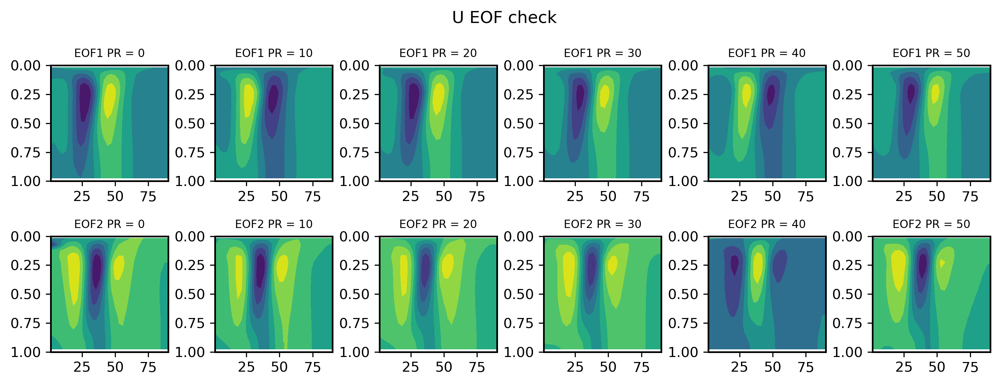

In [107]:
fig, ax = plt.subplots(2,6, figsize=(10,4), dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    ax[0,a].contourf(yy[:,32:], sigma_mean2[:,32:], EOF1_all[a,:,:])
    ax[0,a].set_ylim([1,0])
    ax[0,a].set_title(f"EOF1 PR = {pr}", fontsize=8)

    ax[1,a].contourf(yy[:,32:], sigma_mean2[:,32:], EOF2_all[a,:,:])
    ax[1,a].set_ylim([1,0])
    ax[1,a].set_title(f"EOF2 PR = {pr}", fontsize=8)
    a+=1
plt.suptitle("U EOF check")
fig.tight_layout(rect=[0, 0.03, 1, 0.999])
# plt.tight_layout()
plt.show()

0.0
1.0
2.0
3.0
4.0
5.0
0.0
1.0
2.0
3.0
4.0
5.0


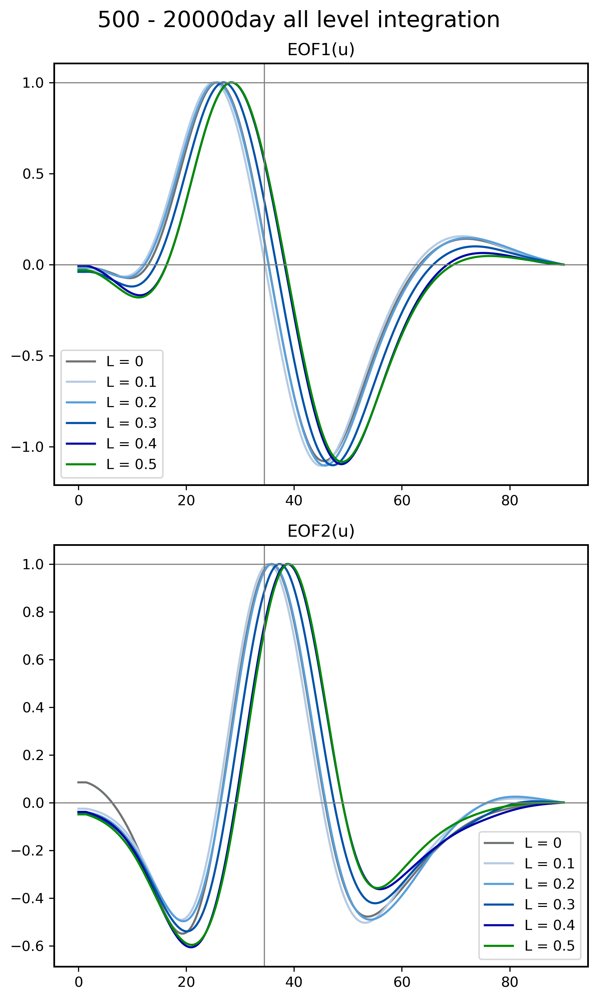

In [167]:
import matplotlib.colors as colors
import matplotlib as mpl

### for color
rgb=([112,115,115])
rgb=np.array(rgb)/255.0
icmap=colors.ListedColormap(rgb,name='my_color')
cmap=mpl.cm.viridis

cmap_color=icmap  
# bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255 # Nick
# colors = np.array([[112,115,115],[202,240,248],[114,224,239],[0,180,216],[0,119,182],[90, 24, 154]])/255 # 44, 7, 53

########
yn_thin = np.linspace(0,90, 32* interpolation_times)

fig,ax = plt.subplots(2,figsize=(6,10),dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF1_all[a,:,:])
    # EOF1_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (-np.nanmean(EOF1_all_thin[a,:, :], axis=0)/ control), label=f"L = {0}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"L = {0.1}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, -(np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"L = {0.2}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*3:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (-np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"L = {0.3}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"L = {0.4}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, -(np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"L = {0.5}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[0].axvline(x=y_pr0, color='gray', lw=0.8) # using u_vertically_bootstrap_latitude.txt
ax[0].axhline(y=1, color='gray', lw=0.8)
ax[0].axhline(y=0, color='gray', lw=0.8)
ax[0].legend()
ax[0].set_title("EOF1(u)")
###########################################################################
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF2_all[a,:,:])
    # EOF2_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/ control), label=f"L = {0}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"L = {0.1}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"L = {0.2}", color=colors[int(pr/pr_leap)])

    if pr == pr_start+pr_leap*3:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, (-np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"L = {0.3}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, (np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"L = {0.4}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"L = {0.5}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[1].axvline(x=y_pr0, color='gray', lw=0.8)
ax[1].axhline(y=1, color='gray', lw=0.8)
ax[1].axhline(y=0, color='gray', lw=0.8)
ax[1].legend()
ax[1].set_title("EOF2(u)")

# plt.suptitle("500 - 2900day Original grid EOF (using all level integration)", fontsize=16)
plt.suptitle(f"{start} - {end}day all level integration", fontsize=16)

plt.tight_layout()
# plt.savefig(f"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig//fig1b {start} - {end}day using all level integration.png", dpi=600., bbox_inches="tight")
plt.savefig(f"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar//fig1b {start} - {end}day using all level integration.png", dpi=600., bbox_inches="tight")

plt.show()


## All levels integration EOF

In [30]:
# test_file      = h5py.File("PR10_50_500_20000day_sigma_onlyz.h5", "r")
# sigma_onlyz       = np.asarray(test_file["sigma_onlyz"][:,:])

In [110]:
def Cal_EOF_PC_all_level_integration(input_data, sigma_onlyz):
    from EOF import EOF
    # input: (day, lat)
    # Perform latitude weighting
    input_data_weighted = input_data * np.sqrt(np.cos(np.deg2rad(np.linspace(0, 90, input_data.shape[1]))))

    # Initialize an EOF instance with weighted input data
    day = input_data.shape[0]  # day 
    dim1 = input_data.shape[1] # lat
    
    judge = day - dim1
    if judge > 0:
        n_component = dim1
    else:
        n_component = day
        
    print("n_component:", n_component)
    eof_instance = EOF((input_data_weighted,), n_components=n_component, field="1D")
    
    # Compute EOFs and PCs
    eof_instance.get()
    
    # Retrieve EOFs and PCs and Extract EOF1, PC1, EOF2, and PC2
    EOF1 = eof_instance.EOF[0,:]
    EOF2 = eof_instance.EOF[1,:]
    
    PC1 = eof_instance.PC[0,:]
    PC2 = eof_instance.PC[1,:]

    # Normalize PCs and EOFs
    PCs_std = PC1.std()
    PC1_norm = PC1 / PCs_std
    
    PC2s_std = PC2.std()
    PC2_norm = PC2 / PC2s_std
    
    EOFs_std = EOF1.std()
    EOF1_norm = EOF1 * PCs_std
    
    EOF2s_std = EOF2.std()
    EOF2_norm = EOF2 * PC2s_std
    
    return EOF1_norm, PC1_norm, EOF2_norm, PC2_norm, eof_instance.explained[:10]

In [111]:
from scipy.interpolate import interp1d
total_pr = int(total_pr)
EOF1_only_y = np.zeros((total_pr, 32))
EOF2_only_y = np.zeros((total_pr, 32))

PC1 = np.zeros((total_pr, total_day))
PC2 = np.zeros((total_pr, total_day))

explained_all = np.zeros((total_pr, 10))

interpolation_times = 10
EOF1_only_y_all_thin = np.zeros((total_pr, 32*interpolation_times))
EOF2_only_y_all_thin = np.zeros((total_pr, 32*interpolation_times))

# sigma coord.
sigma_onlyz_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
sigma_onlyz_all       = np.asarray(sigma_onlyz_file["sigma_onlyz"][:,:])

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # cal EOF and PC
    EOF1_only_y[a,:], PC1[a,:], EOF2_only_y[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC_all_level_integration(np.nanmean(Uzm[a,:,:,32:] * cy[32:]**0.5, axis=1), sigma_onlyz_all[a,:])
    
    # do interpolation
    # Create a linear interpolation model
    f_linear = interp1d(np.linspace(0,90,32), EOF1_only_y[a,:], kind='linear')

    # Interpolate the data
    yys          = np.linspace(0,90,32*interpolation_times)
    EOF1_only_y_all_thin[a,:] = f_linear(yys)

    f_linear = interp1d(np.linspace(0,90,32), EOF2_only_y[a,:], kind='linear')
    EOF2_only_y_all_thin[a,:] = f_linear(yys)
    
    a += 1
print("done")

n_component: 32
n_component: 32
n_component: 32
n_component: 32
n_component: 32
n_component: 32
done


In [33]:
# print(EOF1_only_y_all_thin.shape)

In [34]:
# # reshape EOF1_all
# EOF1_all = np.zeros(((total_pr, 32)))
# EOF2_all = np.zeros(((total_pr, 20, 32)))

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     EOF1_all[a] = np.reshape(EOF1[a], (20,32))
#     EOF2_all[a] = np.reshape(EOF2[a], (20,32))
#     a += 1

0.0
1.0
2.0
3.0
4.0
5.0
0.0
1.0
2.0
3.0
4.0
5.0


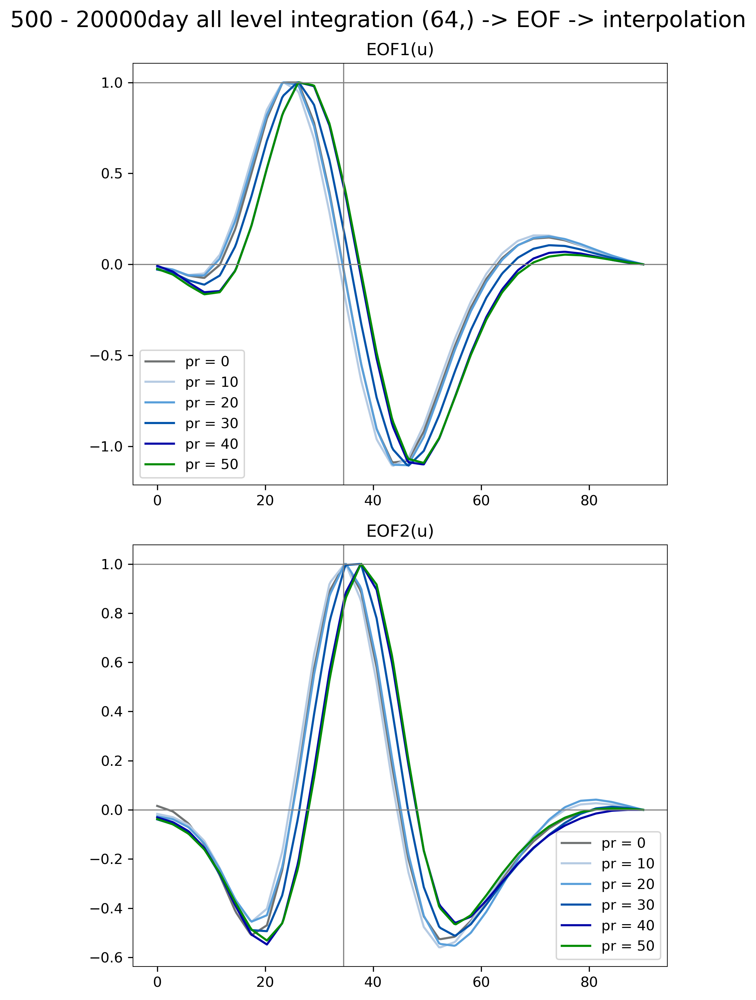

In [35]:
import matplotlib.colors as colors
import matplotlib as mpl

### for color
rgb=([112,115,115])
rgb=np.array(rgb)/255.0
icmap=colors.ListedColormap(rgb,name='my_color')
cmap=mpl.cm.viridis

cmap_color=icmap  
# bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255
########
yn_thin = np.linspace(0,90, 32* interpolation_times)

fig,ax = plt.subplots(2,figsize=(6,10),dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF1_all[a,:,:])
    # EOF1_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (-EOF1_only_y_all_thin[a,:]/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, -(EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*3:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (-EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, -(EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[0].axvline(x=y_pr0, color='gray', lw=0.8) # using u_vertically_bootstrap_latitude.txt
ax[0].axhline(y=1, color='gray', lw=0.8)
ax[0].axhline(y=0, color='gray', lw=0.8)
ax[0].legend()
ax[0].set_title("EOF1(u)")
###########################################################################
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF2_all[a,:,:])
    # EOF2_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])

    if pr == pr_start+pr_leap*3:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, (-EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, (-EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[1].axvline(x=y_pr0, color='gray', lw=0.8)
ax[1].axhline(y=1, color='gray', lw=0.8)
ax[1].axhline(y=0, color='gray', lw=0.8)
ax[1].legend()
ax[1].set_title("EOF2(u)")

# plt.suptitle("500 - 2900day Original grid EOF (using all level integration)", fontsize=16)
plt.suptitle(f"{start} - {end}day all level integration (64,) -> EOF -> interpolation", fontsize=16)

plt.tight_layout()
plt.savefig(f"{start} - {end}day all level integration (64,) -> EOF -> interpolation.png", dpi=600., bbox_inches="tight")
plt.show()


# Explained

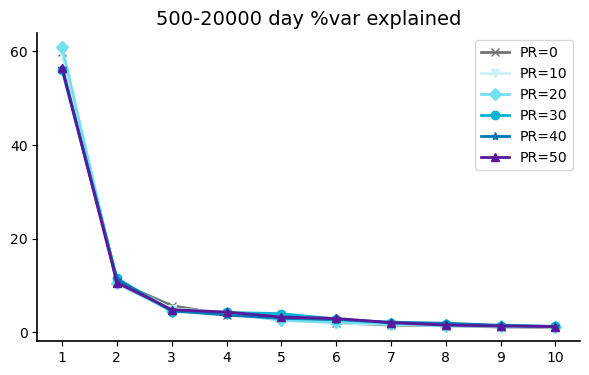

In [211]:
xxx = np.arange(1,11,1)
fig,ax = plt.subplots(figsize=(7,4), dpi=100)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    if pr == pr_start:
        ax.plot(xxx, explained_all[a,:10]*100, "-x", color=colors[int(pr/pr_leap)], lw=2, label="PR=0")
    if pr == pr_start+pr_leap:
        ax.plot(xxx, explained_all[a,:10]*100, "-", color=colors[int(pr/pr_leap)], lw=2, marker='v', label="PR=10")
    if pr == pr_start+pr_leap*2:
        ax.plot(xxx, explained_all[a,:10]*100, "-D", color=colors[int(pr/pr_leap)], lw=2, label="PR=20")
    if pr == pr_start+pr_leap*3:
        ax.plot(xxx, explained_all[a,:10]*100, "-o", color=colors[int(pr/pr_leap)], lw=2, label="PR=30")
    if pr == pr_start+pr_leap*4:
        ax.plot(xxx, explained_all[a,:10]*100, "-*", color=colors[int(pr/pr_leap)], lw=2, label="PR=40")
    if pr == pr_start+pr_leap*5:
        ax.plot(xxx, explained_all[a,:10]*100, "-^", color=colors[int(pr/pr_leap)], lw=2, label="PR=50")
    a += 1
# plt.grid()
plt.title(f"{start}-{end} day %var explained", fontsize=14)
plt.xticks(np.arange(1,11,1))
plt.yticks(np.arange(0,80,20))
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.legend()
plt.savefig("%var explained.png", dpi=600., bbox_inches="tight")


# Autocorrelation

In [111]:
def autocorr1(x,lags):
    corr = np.zeros(int(lags))
    for l in range(lags):
        if l == 0:
            corr[l] = 1.
        else:
            corr[l] = np.corrcoef(x[l:],x[:-l])[0][1]
    # corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in range(lags)]
    return np.array(corr)

In [112]:
PC1_all = PC1
PC2_all = PC2
print(PC1_all.shape)

(6, 19500)


In [140]:
auto_length = 100
yyy_thin  = autocorr1(PC1_all[0,:], auto_length) 
yyy2_thin = autocorr1(PC1_all[1,:], auto_length) 
yyy3_thin = autocorr1(PC1_all[2,:], auto_length) 
yyy4_thin = autocorr1(PC1_all[3,:], auto_length) 
yyy5_thin = autocorr1(PC1_all[4,:], auto_length) 
yyy6_thin = autocorr1(PC1_all[5,:], auto_length) 

yyy_thin2  = autocorr1(PC2_all[0,:], auto_length) 
yyy2_thin2 = autocorr1(PC2_all[1,:], auto_length) 
yyy3_thin2 = autocorr1(PC2_all[2,:], auto_length) 
yyy4_thin2 = autocorr1(PC2_all[3,:], auto_length) 
yyy5_thin2 = autocorr1(PC2_all[4,:], auto_length) 
yyy6_thin2 = autocorr1(PC2_all[5,:], auto_length) 

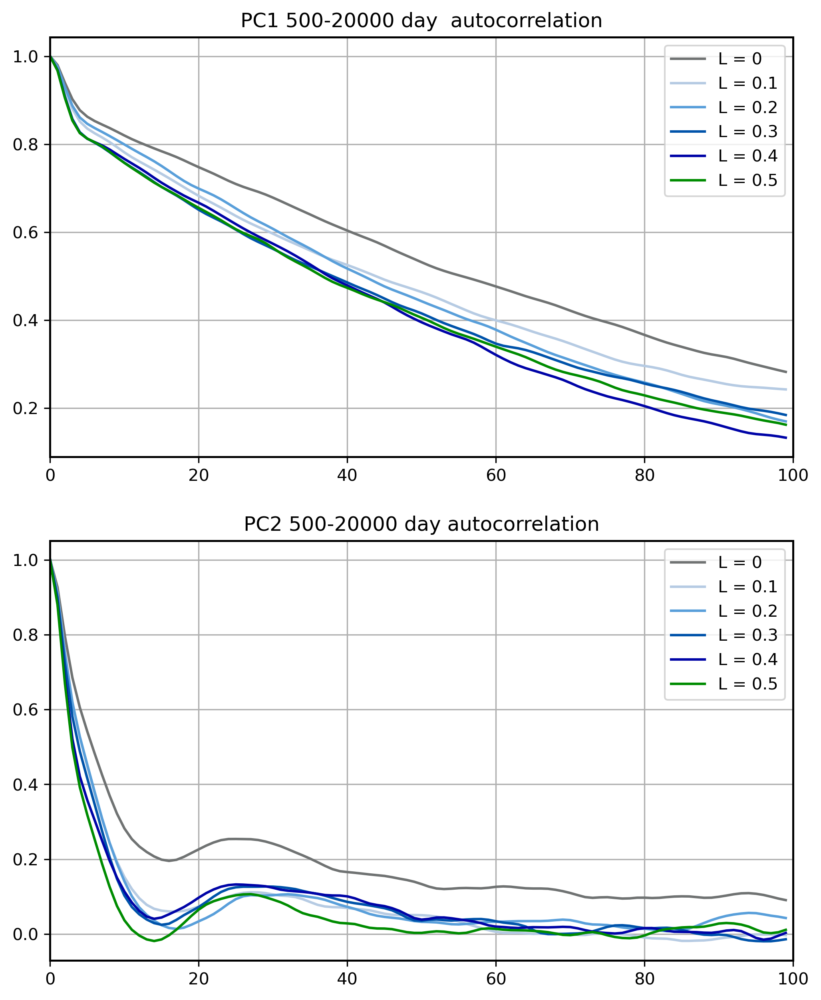

In [168]:
tau = np.arange(0,auto_length,1)
fig, ax = plt.subplots(2,figsize=(8,10),dpi=300)
ax[0].plot(tau, yyy_thin , label=f"L = {pr_start}", color=colors[0])
ax[0].plot(tau, yyy2_thin, label=f"L = {pr_start+0.1}", color=colors[1])
ax[0].plot(tau, yyy3_thin, label=f"L = {pr_start+0.2}", color=colors[2])
ax[0].plot(tau, yyy4_thin, label=f"L = {pr_start+0.3}", color=colors[3])
ax[0].plot(tau, yyy5_thin, label=f"L = {pr_start+0.4}", color=colors[4])
ax[0].plot(tau, yyy6_thin, label=f"L = {pr_start+0.5}", color=colors[5])
ax[0].legend()
ax[0].set_xlim([0,auto_length])
# ax[0].set_title("Original grid PC1 500-2900 day -> EOF, PC ->  autocorrelation")
ax[0].set_title(f"PC1 {start}-{end} day  autocorrelation")


ax[0].grid()

###############################################################

ax[1].plot(tau, yyy_thin2 , label=f"L = {pr_start}", color=colors[0])
ax[1].plot(tau, yyy2_thin2, label=f"L = {pr_start+0.1}", color=colors[1])
ax[1].plot(tau, yyy3_thin2, label=f"L = {pr_start+0.2}", color=colors[2])
ax[1].plot(tau, yyy4_thin2, label=f"L = {pr_start+0.3}", color=colors[3])
ax[1].plot(tau, yyy5_thin2, label=f"L = {pr_start+0.4}", color=colors[4])
ax[1].plot(tau, yyy6_thin2, label=f"L = {pr_start+0.5}", color=colors[5])
ax[1].legend()
ax[1].set_xlim([0,auto_length])
# ax[1].set_title("Original grid PC2 500-2900 day -> EOF, PC ->  autocorrelation")
ax[1].set_title(f"PC2 {start}-{end} day autocorrelation")

ax[1].grid()
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig2_Autocorrelation original grid PC12(500 - 10000 day).png", dpi=600., bbox_inches="tight")
plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar/fig2_Autocorrelation original grid PC12(500 - 10000 day).png", dpi=600., bbox_inches="tight")


plt.show()

## $C_{z_{2}z_{2}}$

In [218]:
gg = np.arange(-100,100)
print(gg[100]+1)

1


In [116]:
def crosscorr1(x,y,lags):
    corr = np.zeros(int(lags))
    lag_half = int(lags/2)
    a = 0
    for l in range(-lag_half, lag_half): #-100 , 0 , 99
        # print(l)
        if l == lag_half:
            corr[a] = 0.
        if l < 0: 
            corr[a] = np.corrcoef(x[-l:],y[:l])[0][1]
        if l > 0: 
            corr[a] = -np.corrcoef(x[l:],y[:-l])[0][1]
        a += 1
        
    # corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in range(lags)]
    return np.array(corr)

In [117]:
auto_length = 200
cross_correl   = crosscorr1(PC1_all[0,:],PC2_all[0,:] , auto_length) 
cross_correl2  = crosscorr1(PC1_all[1,:],PC2_all[1,:] , auto_length) 
cross_correl3  = crosscorr1(PC1_all[2,:],PC2_all[2,:] , auto_length) 
cross_correl4  = crosscorr1(PC1_all[3,:],PC2_all[3,:] , auto_length) 
cross_correl5  = crosscorr1(PC1_all[4,:],PC2_all[4,:] , auto_length) 
cross_correl6  = crosscorr1(PC1_all[5,:],PC2_all[5,:] , auto_length) 


In [118]:
# cross_correl[-1] = 0.

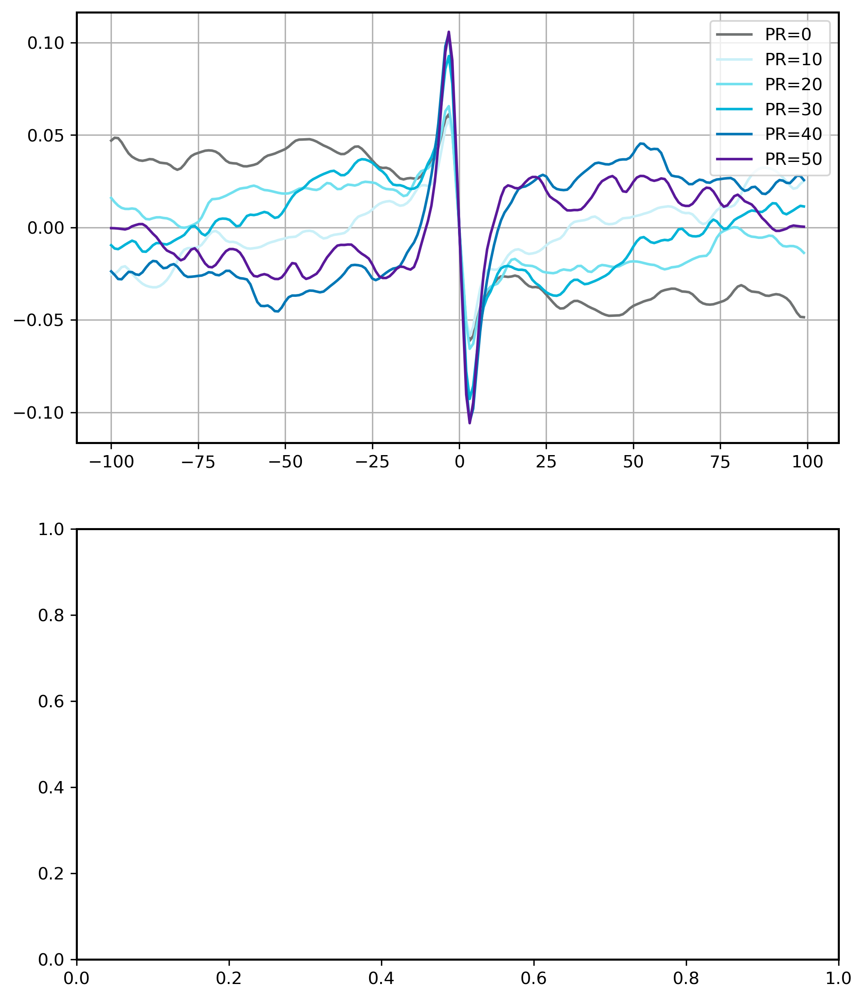

In [119]:
fig, ax = plt.subplots(2,figsize=(8,10),dpi=300)
tau_cross = np.arange(-100,100,1)
# ax[0].plot(tau_cross[:101], cross_correl[:101], label=f"PR={pr_start}", color=colors[0])
# ax[0].plot(tau_cross[-100:], -cross_correl[-100:], label=f"PR={pr_start}", color=colors[0])
ax[0].plot(tau_cross, cross_correl, label=f"PR={pr_start}", color=colors[0])


ax[0].plot(tau_cross, -cross_correl2, label=f"PR={pr_start+pr_leap}", color=colors[1])
ax[0].plot(tau_cross, cross_correl3, label=f"PR={pr_start+pr_leap*2}", color=colors[2])
ax[0].plot(tau_cross, cross_correl4, label=f"PR={pr_start+pr_leap*3}", color=colors[3])
ax[0].plot(tau_cross, cross_correl5, label=f"PR={pr_start+pr_leap*4}", color=colors[4])
ax[0].plot(tau_cross, cross_correl6, label=f"PR={pr_start+pr_leap*5}", color=colors[5])
ax[0].legend()
# ax[0].set_xlim([0,auto_length])
# ax[0].set_title("Original grid PC1 500-2900 day -> EOF, PC ->  autocorrelation")
# ax[0].set_title(f"U Original grid PC2 {start}-{end} day -> EOF, PC ->  autocorrelation")


ax[0].grid()


# $dlog(C_{z_{1}z_{1}}) / d\tau$

$dlog(C_{z_{1}z_{1}}) / d\tau$\n
eddy feed back 60~66day
L=0, 1/tau= 79.78373987669603
L=10, 1/tau= 66.28407748836575
L=20, 1/tau= 58.66344874247876
L=30, 1/tau= 58.207176699401856
L=40, 1/tau= 50.31451704233443
L=50, 1/tau= 54.597378719909116


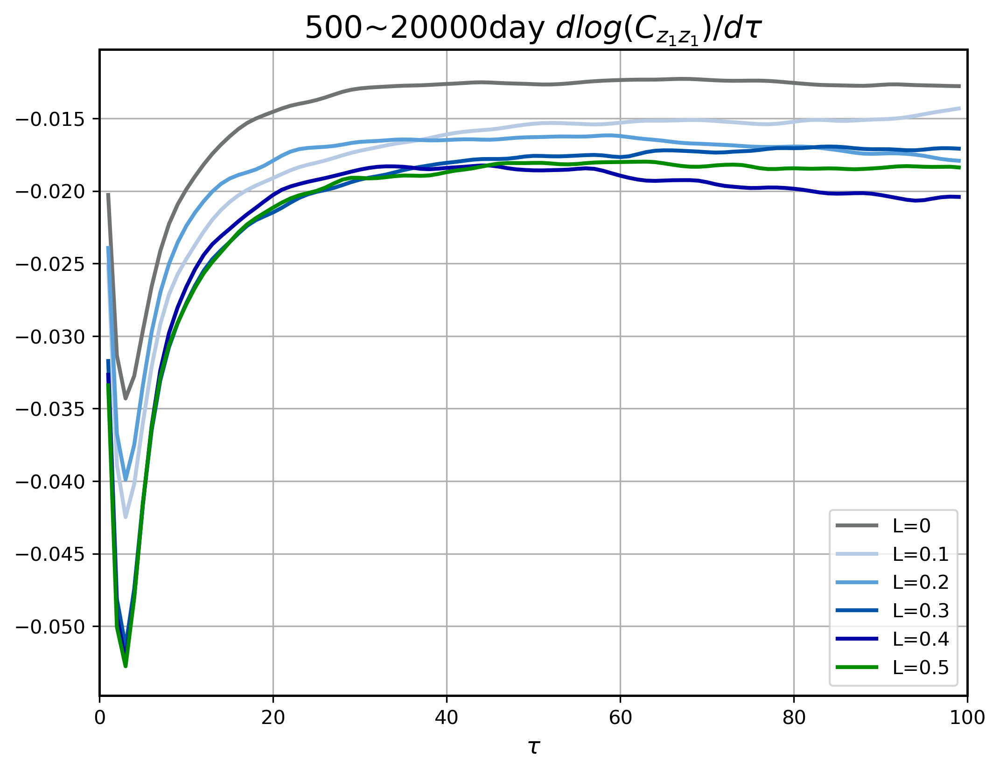

[ 0.         -0.02027581 -0.03134219 -0.03430505 -0.03274543 -0.02960664
 -0.02659974 -0.02414534 -0.02228271 -0.02093159 -0.01989078 -0.01899672
 -0.0181767  -0.01744082 -0.01680594 -0.01623958 -0.01573193 -0.01531947
 -0.01501447 -0.01477212 -0.01454384 -0.01431816 -0.01413025 -0.01399559
 -0.01387956 -0.01373613 -0.01356071 -0.01335983 -0.01316818 -0.01302603
 -0.01293721 -0.01288185 -0.01284237 -0.01280992 -0.01277677 -0.01274926
 -0.01273591 -0.01272068 -0.01269305 -0.01265941 -0.01262755 -0.01259859
 -0.01256356 -0.01252798 -0.01251313 -0.01252825 -0.01255906 -0.01258463
 -0.01260133 -0.01261847 -0.01264309 -0.01266441 -0.01266235 -0.01263549
 -0.01259336 -0.01253949 -0.01248444 -0.01243888 -0.01240345 -0.01237725
 -0.01235857 -0.01234188 -0.01233085 -0.01233036 -0.01232883 -0.01231238
 -0.01228991 -0.01227692 -0.01228295 -0.0123107  -0.01234557 -0.01237703
 -0.01240078 -0.01241031 -0.01240621 -0.01239832 -0.01239833 -0.01241774
 -0.01245631 -0.01250637 -0.01255729 -0.01260675 -0

In [169]:
plt.figure(figsize=(8,6), dpi=300)
total_pr = int(total_pr)
length = 100
total_L_final = np.zeros(total_pr)
total_L = np.zeros((total_pr,length))
aa  = 0
print(r"$dlog(C_{z_{1}z_{1}}) / d\tau$\n")
print("eddy feed back 60~66day")
for pr in range(pr_start, pr_to, pr_leap):
    for i in range(1,len(total_L[aa,:])):
        if aa == 0:
            total_L[aa,i]      = np.log(yyy_thin[i])/int(i)
        elif aa == 1:
            total_L[aa,i]      = np.log(yyy2_thin[i])/int(i)
        elif aa == 2:
            total_L[aa,i]      = np.log(yyy3_thin[i])/int(i)
        elif aa == 3:
            total_L[aa,i]      = np.log(yyy4_thin[i])/int(i)
        elif aa == 4:
            total_L[aa,i]      = np.log(yyy5_thin[i])/int(i)
        elif aa == 5:
            total_L[aa,i]      = np.log(yyy6_thin[i])/int(i)

        if i >= 60 and i <= 99:
            total_L_final[aa] += total_L[aa,i] 
    total_L_final[aa] /= 40 #len(total_L[aa,:])
    if aa == 0:
        plt.plot(tau[1:], total_L[aa,1:] , label=f"L={0}", color=colors[int(pr/pr_leap)], lw=2)
    else:
        plt.plot(tau[1:], total_L[aa,1:] , label=f"L={round(aa*0.1,1)}", color=colors[int(pr/pr_leap)], lw=2)
    plt.legend()
    # print(f"PR={aa*10},a=", np.exp(total_L_final[aa]),"1/tau=", -1/(total_L_final[aa]) )
    print(f"L={aa*10}, 1/tau=", -1/(total_L_final[aa]) )
    
    # print(f"PR={aa*10})
    
    aa += 1
plt.title(f"{start}~{end}day" + r" $dlog(C_{z_{1}z_{1}}) / d\tau$", fontsize=16)

plt.xlabel(r"$\tau $", fontsize=12)
# plt.xticks(np.arange(0,length-1), np.arange(1,length), fontsize=12)
plt.xlim([0,100])
plt.grid()
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/figdCz1z1dtau.png", dpi=600.)
plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar/figdCz1z1dtau.png", dpi=600.)



plt.show()

print(total_L[0])
print(total_L_final[0])

In [41]:
total_L_final.shape

(6,)

# TEM

In [42]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

class TEM_dp_Sukiyoung_fit_zonalmean:
    def __init__(self, Vzm, Omega_zm, Pzm, PSzm, Tzm, Z_full_zm, THzm, v_prime, theta_prime, sigma_mean, total_pr, total_day, single_day):
        self.Rd = 287
        self.cp = 1004
        self.g = 9.81
        self.a = 6.37122e6
        self.Vzm = Vzm
        self.Omega_zm = Omega_zm
        self.Pzm = Pzm
        self.PSzm = PSzm
        self.Tzm = Tzm
        self.Zzm = Z_full_zm
        self.Vza = v_prime
        self.THza = theta_prime
        self.sigma_mean = sigma_mean
        self.total_pr = total_pr
        self.total_day = total_day
        self.single_day = single_day
        self.setup_dimensions()
        self.compute_means()

    def setup_dimensions(self):
        self.day = 1 if self.single_day else self.total_day
        self.lev = 20  # Assuming a fixed number of levels for simplicity
        self.lat = 64  # Assuming a fixed number of latitudes for simplicity

    def compute_means(self):
        axis = (1,) if self.single_day else (0, 2)
        self.p_onlyz = np.nanmean(self.Pzm, axis=axis)
        self.Vzmtm = np.nanmean(self.Vzm, axis=0)
        self.sigma_onlyz = np.nanmean(self.sigma_mean, axis=1)
        self.y = np.linspace(-90, 90, self.lat)
        self.yy, self.sigma_mean2 = np.meshgrid(self.y, self.sigma_onlyz)
        self.rho = self.Pzm / self.PSzm
        self.Wzm = -self.Omega_zm / (self.rho * self.g)
        self.Wzmtm = np.nanmean(self.Wzm, axis=0)
        self.theta = self.Tzm * (self.PSzm / self.Pzm) ** (self.Rd / self.cp)
        # self.phi = np.deg2rad(self.y)  # Get latitude in radians
        self.phi = np.broadcast_to(np.deg2rad(self.y).reshape(1,self.lat),(self.lev,self.lat)) # Get latitude in radians
        self.cphi = np.cos(self.phi) 
        self.acphi = self.a * self.cphi

    def calculate_vTEM_wTEM(self):
        # Calculate v* and w* components
        THzmtm = np.nanmean(self.theta, axis=(2 if self.single_day else 0))
        dTHdp = np.gradient(THzmtm, self.p_onlyz, axis=0, edge_order=2)
        VTHETA = self.Vza * self.THza
        VTHzm = np.nanmean(VTHETA, axis=2 if self.single_day else 3)
        VTHzmtm = np.nanmean(VTHzm, axis=0)
        vTEM_temp = VTHzmtm / dTHdp
        vTEM_tempdz = np.gradient(vTEM_temp, self.p_onlyz, axis=0, edge_order=2)
        vTEM = self.Vzmtm - vTEM_tempdz
        
        wTEM_temp = self.cphi * VTHzmtm / dTHdp
        lat_spacing = np.mean(np.diff(np.deg2rad(self.y)))  # Assuming even spacing for simplicity
        wTEM_tempdphi = np.gradient(wTEM_temp, lat_spacing, axis=1, edge_order=2)
        wTEM = self.Wzmtm - wTEM_tempdphi / self.acphi
        
        # Apply Gaussian filtering
        vTEM_smoothed = gaussian_filter(vTEM, sigma=[0, 1])
        wTEM_smoothed = gaussian_filter(wTEM, sigma=[0, 1])
        
        return vTEM_smoothed, wTEM_smoothed
        # return vTEM, wTEM
        

    def improved_derivative(y, x):
        dydx = np.zeros_like(y)
        # Handle boundaries with first-order accurate differences
        dydx[0] = (y[1] - y[0]) / (x[1] - x[0])  # Forward difference at the start
        dydx[-1] = (y[-1] - y[-2]) / (x[-1] - x[-2])  # Backward difference at the end
    
        # Higher-order central differences for the interior points
        dydx[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
        return dydx

    def linear_extrapolate(self, psi):
        # Assuming psi[-2, :] and psi[-3, :] are the two points before the boundary
        gradient = psi[-2, :] - psi[-3, :]
        psi[-1, :] = psi[-2, :] + gradient  # Extrapolate to the next point
        return psi
    
    def calculate_psi(self, vTEM, wTEM):
        psi_w1 = np.zeros_like(vTEM)
        psi_w1[0, :] = 0  # Initialize the first level
        
        # Calculate psi using the vertical integration
        for ilev in range(1, self.lev - 1):  # Stop calculation one level before the last
            dlev = self.p_onlyz[ilev] - self.p_onlyz[ilev-1]  
            psi_w1[ilev, :] = psi_w1[ilev-1, :] - 2 * np.pi / self.g * self.acphi[ilev, :] * (dlev * vTEM[ilev, :])
    
        # Extrapolate to the last level
        psi_w1 = self.linear_extrapolate(psi_w1)
    
        return psi_w1

    def plot_psi(self, psi):
        fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
        CS = ax.contourf(self.yy, self.sigma_mean2, psi, levels=21, cmap="RdBu_r", extend="both")
        plt.colorbar(CS, ax=ax)
        ax.set_ylim([1, 0])
        ax.set_title("Stream Function $\psi$ (kg s$^{-1}$) after Gaussian filter")
        # ax.set_title("Stream Function $\psi$ (kg s$^{-1}$)")
        
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8,6), dpi=150.)
        CS = plt.contour(yy,sigma_mean2, psi / 10**9, levels=21, colors='k') # 
        plt.clabel(CS)
        plt.ylim([1,0])
        plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10 after Gaussian filter", fontsize=16)
        # plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10", fontsize=16)
        
        # plt.savefig("TEM_PR10.png", dpi=600., bbox_inches='tight')
        plt.show()

    def process_and_plot(self):
        vTEM, wTEM = self.calculate_vTEM_wTEM()
        psi = self.calculate_psi(vTEM, wTEM)
        # self.plot_vTEM_wTEM(vTEM, wTEM)
        self.plot_psi(psi)

# Usage of this class would involve instantiation with appropriate data arrays for the input parameters and calling process_and_plot().


In [43]:
str = "tmp_zonal_mean"
v_file1      = h5py.File(str+"PR10_50_0_10000day_v.h5", "r")
v_file2      = h5py.File(str+"PR10_50_10000_20000day_v.h5", "r")

v1       = np.asarray(v_file1["v"][:,:,:,:])
v2       = np.asarray(v_file2["v"][:,:,:,:])
#################################################################
w_file1      = h5py.File(str+"PR10_50_0_10000day_w.h5", "r")
w_file2      = h5py.File(str+"PR10_50_10000_20000day_w.h5", "r")

w1       = np.asarray(w_file1["w"][:,:,:,:])
w2       = np.asarray(w_file2["w"][:,:,:,:])
#################################################################
p_file1      = h5py.File(str+"PR10_50_0_10000day_p.h5", "r")
p_file2      = h5py.File(str+"PR10_50_10000_20000day_p.h5", "r")

p1       = np.asarray(p_file1["p"][:,:,:,:])
p2       = np.asarray(p_file2["p"][:,:,:,:])
#################################################################
t_file1      = h5py.File(str+"PR10_50_0_10000day_t.h5", "r")
t_file2      = h5py.File(str+"PR10_50_10000_20000day_t.h5", "r")

t1       = np.asarray(t_file1["t"][:,:,:,:])
t2       = np.asarray(t_file2["t"][:,:,:,:])
#################################################################
z_file1      = h5py.File(str+"PR10_50_0_10000day_z_full.h5", "r")
z_file2      = h5py.File(str+"PR10_50_10000_20000day_z_full.h5", "r")

z1       = np.asarray(z_file1["z_full"][:,:,:,:])
z2       = np.asarray(z_file2["z_full"][:,:,:,:])
#################################################################
ps_file1      = h5py.File(str+"PR10_50_0_10000day_ps.h5", "r")
ps_file2      = h5py.File(str+"PR10_50_10000_20000day_ps.h5", "r")

ps1       = np.asarray(ps_file1["ps"][:,:,:,:])
ps2       = np.asarray(ps_file2["ps"][:,:,:,:])
#################################################################
theta_file1      = h5py.File(str+"PR10_50_500_20000day_theta.h5", "r")
# theta_file2      = h5py.File(str+"PR10_50_10000_20000day_theta.h5", "r")

# theta1       = np.asarray(theta_file1["theta"][:,:,:,:])
theta1       = np.asarray(theta_file1["theta"][:,:,:,:])


In [44]:
Vzm = np.append(v1[:,start:], v2, axis=1)
Omega_zm = np.append(w1[:,start:], w2, axis=1)
Pzm = np.append(p1[:,start:], p2, axis=1)
Tzm = np.append(t1[:,start:], t2, axis=1)
Z_full_zm = np.append(z1[:,start:], z2, axis=1)
PSzm = np.append(ps1[:,start:], ps2, axis=1)
TH_zm = theta1




In [45]:
v_prime_file      = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
theta_prime_file  = h5py.File("PR10_50_500_20000day_theta_prime.h5", "r")


v_prime     = np.asarray(v_prime_file["v_prime"][:,:,:,:,:])
theta_prime = np.asarray(theta_prime_file["theta_prime"][:,:,:,:,:])


In [46]:
# print(PSzm.shape)

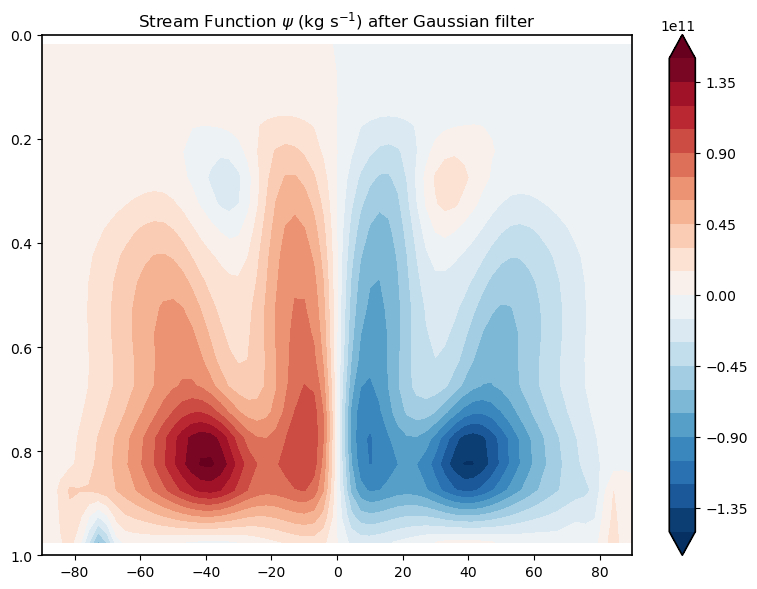

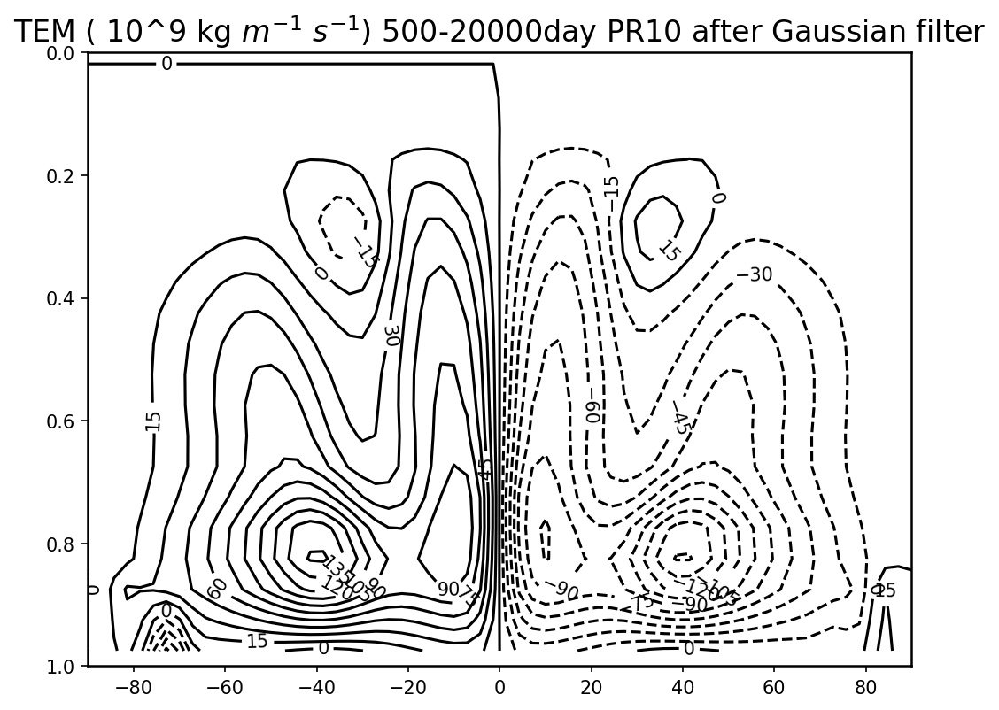

In [47]:
a = 1
tem = TEM_dp_Sukiyoung_fit_zonalmean(Vzm[a,:], Omega_zm[a,:], Pzm[a,:], PSzm[a,:], Tzm[a,:], Z_full_zm[a,:], TH_zm[a,:], v_prime[a,:], theta_prime[a,:], sigma_mean, total_pr, total_day, False)
tem.process_and_plot()

In [237]:

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     # cal EOF and PC
#     EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])

# Three cell circulation

In [166]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

class TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation:
    def __init__(self, Vzm, Omega_zm, Pzm, PSzm, Tzm, Z_full_zm, THzm, v_prime, theta_prime, sigma_mean, total_pr, total_day, single_day):
        self.Rd = 287
        self.cp = 1004
        self.g = 9.81
        self.a = 6.37122e6
        self.Vzm = Vzm
        self.Omega_zm = Omega_zm
        self.Pzm = Pzm
        self.PSzm = PSzm
        self.Tzm = Tzm
        self.Zzm = Z_full_zm
        self.Vza = v_prime
        self.THza = theta_prime
        self.sigma_mean = sigma_mean
        self.total_pr = total_pr
        self.total_day = total_day
        self.single_day = single_day
        self.setup_dimensions()
        self.compute_means()

    def setup_dimensions(self):
        self.day = 1 if self.single_day else self.total_day
        self.lev = 20  # Assuming a fixed number of levels for simplicity
        self.lat = 64  # Assuming a fixed number of latitudes for simplicity

    def compute_means(self):
        axis = (1,) if self.single_day else (0, 2)
        self.p_onlyz = np.nanmean(self.Pzm, axis=axis)
        self.Vzmtm = np.nanmean(self.Vzm, axis=0)
        self.sigma_onlyz = np.nanmean(self.sigma_mean, axis=1)
        self.y = np.linspace(-90, 90, self.lat)
        self.yy, self.sigma_mean2 = np.meshgrid(self.y, self.sigma_onlyz)
        self.rho = self.Pzm / self.PSzm
        self.Wzm = -self.Omega_zm / (self.rho * self.g)
        self.Wzmtm = np.nanmean(self.Wzm, axis=0)
        self.theta = self.Tzm * (self.PSzm / self.Pzm) ** (self.Rd / self.cp)
        # self.phi = np.deg2rad(self.y)  # Get latitude in radians
        self.phi = np.broadcast_to(np.deg2rad(self.y).reshape(1,self.lat),(self.lev,self.lat)) # Get latitude in radians
        self.cphi = np.cos(self.phi) 
        self.acphi = self.a * self.cphi

    def calculate_vTEM_wTEM(self):
        # Calculate v* and w* components
        THzmtm = np.nanmean(self.theta, axis=(2 if self.single_day else 0))
        dTHdp = np.gradient(THzmtm, self.p_onlyz, axis=0, edge_order=2)
        VTHETA = self.Vza * self.THza
        VTHzm = np.nanmean(VTHETA, axis=2 if self.single_day else 3)
        VTHzmtm = np.nanmean(VTHzm, axis=0)
        vTEM_temp = VTHzmtm / dTHdp
        vTEM_tempdz = np.gradient(vTEM_temp, self.p_onlyz, axis=0, edge_order=2)
        vTEM = self.Vzmtm #- vTEM_tempdz
        
        wTEM_temp = self.cphi * VTHzmtm / dTHdp
        lat_spacing = np.mean(np.diff(np.deg2rad(self.y)))  # Assuming even spacing for simplicity
        wTEM_tempdphi = np.gradient(wTEM_temp, lat_spacing, axis=1, edge_order=2)
        wTEM = self.Wzmtm #- wTEM_tempdphi / self.acphi
        
        # Apply Gaussian filtering
        vTEM_smoothed = gaussian_filter(vTEM, sigma=[0, 1])
        wTEM_smoothed = gaussian_filter(wTEM, sigma=[0, 1])
        
        return vTEM_smoothed, wTEM_smoothed
        # return vTEM, wTEM
        

    def improved_derivative(y, x):
        dydx = np.zeros_like(y)
        # Handle boundaries with first-order accurate differences
        dydx[0] = (y[1] - y[0]) / (x[1] - x[0])  # Forward difference at the start
        dydx[-1] = (y[-1] - y[-2]) / (x[-1] - x[-2])  # Backward difference at the end
    
        # Higher-order central differences for the interior points
        dydx[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
        return dydx

    def linear_extrapolate(self, psi):
        # Assuming psi[-2, :] and psi[-3, :] are the two points before the boundary
        gradient = psi[-2, :] - psi[-3, :]
        psi[-1, :] = psi[-2, :] + gradient  # Extrapolate to the next point
        return psi
    
    def calculate_psi(self, vTEM, wTEM):
        psi_w1 = np.zeros_like(vTEM)
        psi_w1[0, :] = 0  # Initialize the first level
        
        # Calculate psi using the vertical integration
        for ilev in range(1, self.lev - 1):  # Stop calculation one level before the last
            dlev = self.p_onlyz[ilev] - self.p_onlyz[ilev-1]  
            psi_w1[ilev, :] = psi_w1[ilev-1, :] - 2 * np.pi / self.g * self.acphi[ilev, :] * (dlev * vTEM[ilev, :])
    
        # Extrapolate to the last level
        psi_w1 = self.linear_extrapolate(psi_w1)
    
        return psi_w1

    def plot_psi(self, psi):
        fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
        CS = ax.contourf(self.yy, self.sigma_mean2, psi, levels=21, cmap="RdBu_r", extend="both")
        plt.colorbar(CS, ax=ax)
        ax.set_ylim([1, 0])
        ax.set_title("Three cell circulation Stream Function $\psi$ (kg s$^{-1}$) after Gaussian filter")
        # ax.set_title("Stream Function $\psi$ (kg s$^{-1}$)")
        
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8,6), dpi=150.)
        CS = plt.contour(yy,sigma_mean2, psi / 10**9, levels=21, colors='k') # 
        plt.clabel(CS)
        plt.ylim([1,0])
        plt.title("Three cell circulation ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10 after Gaussian filter", fontsize=16)
        # plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10", fontsize=16)
        
        # plt.savefig("TEM_PR10.png", dpi=600., bbox_inches='tight')
        plt.show()

    def process_and_plot(self):
        vTEM, wTEM = self.calculate_vTEM_wTEM()
        psi = self.calculate_psi(vTEM, wTEM)
        # self.plot_vTEM_wTEM(vTEM, wTEM)
        self.plot_psi(psi)

# Usage of this class would involve instantiation with appropriate data arrays for the input parameters and calling process_and_plot().


In [167]:
# TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation

__main__.TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation

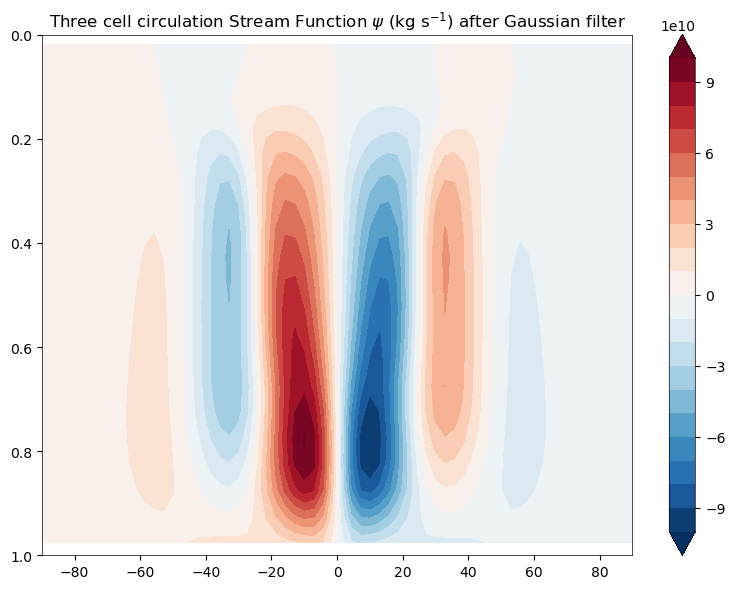

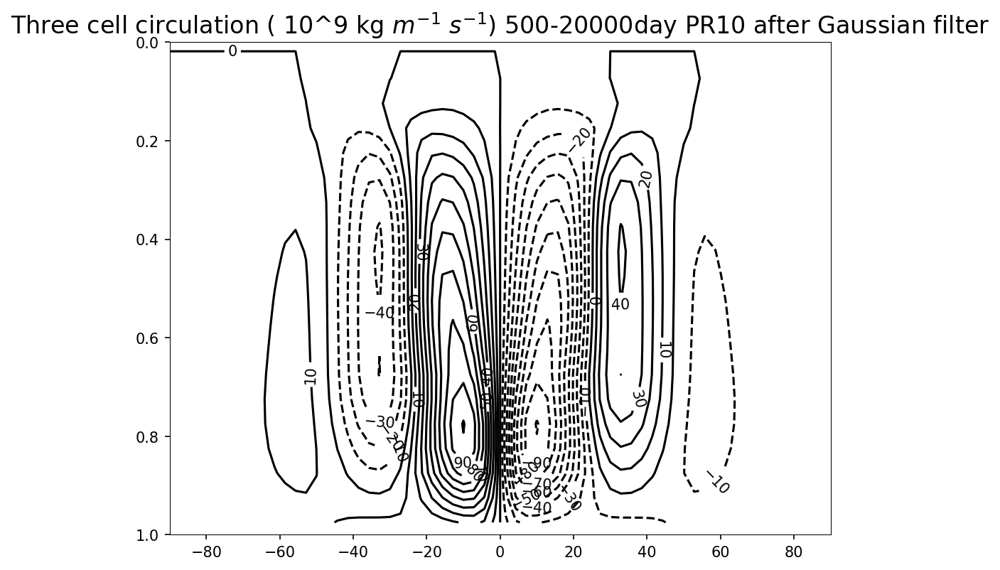

In [168]:
# a = 0
# tem = TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation(Vzm[a,:], Omega_zm[a,:], Pzm[a,:], PSzm[a,:], Tzm[a,:], Z_full_zm[a,:], TH_zm[a,:], v_prime[a,:], theta_prime[a,:], sigma_mean, total_pr, total_day, False)
# tem.process_and_plot()

# Fig.3 LH01 

In [121]:
EMF_file1      = h5py.File("PR10_50_500_20000day_EMF_origin_grid.h5", "r")
EMF_file0      = h5py.File("PR0_500_20000day_EMF_origin_grid.h5", "r")

EMF1       = np.asarray(EMF_file1["EMF"][:,:,:,:])
EMF0       = np.asarray(EMF_file0["EMF"][:,:,:,:])

EMF_oringin_grid = np.append(EMF0, EMF1, axis=0)

In [122]:
radius  = 6.37122e6
y = np.linspace(-90,90,64)
yd = np.deg2rad(y)
cy = np.cos(yd)
# cy [0] = np.nan
# cy [-1] = np.nan

dmdy = np.zeros((((6, 19500, 20, 64))))
print(dmdy.shape)
for a in range(6):
    Mzm = EMF_oringin_grid[a]
    for i in range(1,64-1):
        Mzm[:,:,i] = cy[i]**0.5 * Mzm[:,:,i]
    
    for i in range(1,64-1):
        dmdy[a,:,:,i] = -(Mzm[:,:,i+1] * (cy[i]**2) - Mzm[:,:,i-1]* (cy[i]**2)) / (radius * (cy[i]**2) * (yd[i+1] - yd[i-1]))
        # print(a * (yd[i+1]))
    dmdy[a,:,:, 0] = -(Mzm[:,:, 1]* (cy[i]**2) - Mzm[:,:, 0]* (cy[i]**2)) / (radius* cy[i]**2 *(yd[ 1] - yd[ 0]))
    dmdy[a,:,:,-1] = -(Mzm[:,:,-1]* (cy[i]**2) - Mzm[:,:,-2]* (cy[i]**2)) / (radius* cy[i]**2 *(yd[-1] - yd[-2]))

(6, 19500, 20, 64)


(1.0, 0.0)

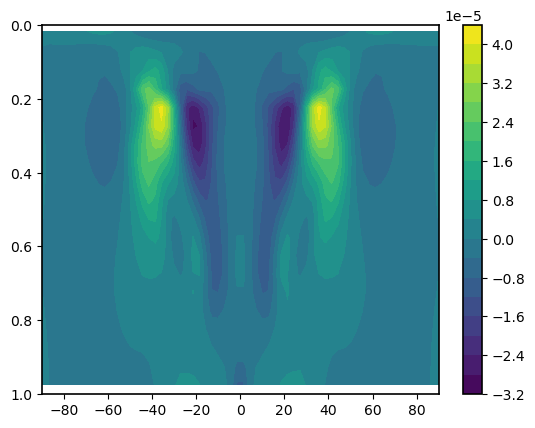

In [123]:
plt.figure()
plt.contourf(yy, sigma_mean2, np.nanmean(dmdy[0], axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])

In [241]:
# b_prime_file0      = h5py.File("PR0_500_20000day_b_prime.h5", "r")
# b_prime_file1      = h5py.File("PR10_50_500_20000day_b_prime.h5", "r")

# b_prime0       = np.asarray(b_prime_file0["b_prime"][:,:,:,:])
# b_prime1       = np.asarray(b_prime_file1["b_prime"][:,:,:,:])

# b_prime = np.append(b_prime0, b_prime1, axis=0)

In [242]:
# test_file = h5py.File("PR0_500_20000day_b_prime.h5", "r")
# b_prime  = np.asarray(test_file["b_prime"][:,:,:,:])


In [243]:
# # with h5py.File('PR0_500_20000day_N_square.h5','w') as N_square_file :
# #     N_square_file.create_dataset('N_square',data=N_square)
# N_square_file0      = h5py.File("PR0_500_20000day_N_square.h5", "r")
# N_square_file1      = h5py.File("PR10_50_500_20000day_N_square.h5", "r")

# N_square0       = np.asarray(N_square_file0["N_square"][:,:,:,:])
# N_square1       = np.asarray(N_square_file1["N_square"][:,:,:,:])

# N_square = np.append(N_square0, N_square1, axis=0)

In [244]:
# v_prime_file0      = h5py.File("PR0_500_20000day_v_prime.h5", "r")
# v_prime_file1      = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
# # theta_prime_file  = h5py.File("PR10_50_500_20000day_theta_prime.h5", "r")

# v_prime0     = np.asarray(v_prime_file0["v_prime"][:,:,:,:,:])
# v_prime1     = np.asarray(v_prime_file1["v_prime"][:,:,:,:,:])
# # theta_prime = np.asarray(theta_prime_file["theta_prime"][:,:,:,:,:])

# v_prime = np.append(v_prime0, v_prime1, axis=0)

In [245]:
# N_square[N_square < 0] = 1E-5

In [246]:
# MHF = np.zeros((((6, 19500, 20, 64))))
# for i in range(6):
#     MHF[i] = np.nanmean(v_prime[i] * b_prime[i], axis=3) / np.nanmean(N_square[i], axis=3) # np.nanmean(N_square_smoothed[i], axis=3)
# print(MHF.shape)

In [247]:
# with h5py.File('PR0_50_500_20000day_MHF_edited_1E_negative5.h5','w') as MHF_file :
#     MHF_file.create_dataset('MHF',data=MHF)
# print("MHF saving done! Remember to delete this cell!")

# MHF_file      = h5py.File("PR0_50_500_20000day_MHF.h5", "r")
# MHF     = np.asarray(MHF_file["MHF"][:,:,:,:])



In [248]:
MHF_file      = h5py.File("PR0_50_500_20000day_MHF_edited_1E_negative5.h5", "r")
MHF           = np.asarray(MHF_file["MHF"][:,:,:,:])

In [249]:
print(MHF.shape)
# print(

(6, 19500, 20, 64)


In [250]:
f0  = 2 * 7.292E-5 * np.sin(yd)

MHF_f  = np.zeros((((6, 19500, 20, 32)))) # mean meridional heat flux 
for a in range(6):
    for i in range(32):
        MHF_f[a,:,:,i] = MHF[a,:,:,i+32] * f0[i+32]

In [251]:
# str = "tmp_zonal_mean"
z_full_file1  = h5py.File("PR10_50_0_20000day_z_full.h5", "r")
# z_full_file2  = h5py.File("PR10_50_10000_20000day_z_full.h5", "r")

z_full1  = np.asarray(z_full_file1["z_full"][:,int(start):,:,:,:])
# z_full2  = np.asarray(z_full_file2["z_full"][:,:,:,:,:])

In [252]:
# z_full10_50 = np.append(z_full1, z_full2, axis=1)

In [253]:
z_full_file3  = h5py.File("PR0_0_20000day_z_full.h5", "r")
# z_full_file4  = h5py.File(str+"PR0_10000_20000day_z_full.h5", "r")

z_full3  = np.asarray(z_full_file3["z_full"][:,int(start):,:,:,:])
# z_full4  = np.asarray(z_full_file4["z_full"][:,:,:,:])

# z_full0 = np.append(z_full3, z_full4, axis=1)

In [254]:
z = np.append(z_full3, z_full1, axis=0)

In [ ]:
print(z.shape)

In [ ]:
z_time_mean = np.nanmean(z, axis=1)

In [ ]:
print(z_time_mean.shape)

In [ ]:
print(z_time_mean.shape)

In [ ]:
print(z.shape)

In [ ]:
Zzm = np.nanmean(z, axis=4)

In [ ]:
from datetime import datetime

now = datetime.now()

current_time = now.strftime("%D:%H:%M:%S")
print("Current Time =", current_time)

q2 = np.zeros((((6, 19500, 20, 32))))
for a in range(6):
    for k in range(19500):
        for i in range(1,20-1):
            q2[a,k,i,:] = (MHF[a,k,i+1,32:] - MHF[a,k,i-1,32:])  / (Zzm[a,k,i+1,32:]-Zzm[a,k,i-1,32:])
        q2[a,k,0,:]  = (MHF[a,k,1,32:] - MHF[a,k,0,32:])    / (Zzm[a,k,1,32:]  - Zzm[a,k,0,32:])
        q2[a,k,19,:] = (MHF[a,k,19,32:] - MHF[a,k,18,32:])  / (Zzm[a,k,19,32:] - Zzm[a,k,18,32:])
    print(a)

In [ ]:
q2.shape

In [ ]:
v_star = np.zeros(q2.shape)
for a in range(6):
    v_star[a] = Vzm[a,:,:,32:] - q2[a]


plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], Vzm[0,:,:,32:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("Vzm")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], q2[0,:,:,:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("q2")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], v_star[0,:,:,:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$v^*$")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$f_0v^*$")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.nanmean(dmdy[0,:,:,32:] + f0[32:]*q2[0], axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$\overline{v'q'}$")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0].mean(axis=0) + np.nanmean(f0[32:]*q2[0] + dmdy[0,:,:,32:], axis=0), levels=np.linspace(-8E-5, 8E-5,21), cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("$f_0v^*$+$\overline{v'q'}$")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.nanmean(dmdy[0,:,:,32:], axis=0) , levels=21, cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("dmdy")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0,:1].mean(axis=0) + np.nanmean(f0[32:]*q2[0,:1] + dmdy[0,:1,:,32:]- dmdy[0,:1,:,32:], axis=0) , levels=np.linspace(-8E-5, 8E-5,21), cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("500-600 day $f_0 \overline{v}^*$+$\overline{v'q'}$ - dmdy")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0,:1].mean(axis=0) + np.nanmean(f0[32:]*q2[0,:1] + dmdy[0,:1,:,32:]- dmdy[0,:1,:,32:] - f0[32:] * Vzm[0,:1,:,32:], axis=0)  , levels=21, cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("500-20000 day $f_0 \overline{v}^*$+$\overline{v'q'}$ - dmdy - $f_0 \overline{v}$")

In [ ]:
day = 19500
# vq = EMF + 
vq_final = f0[32:]*q2 + dmdy[:,:,:,32:]
print(vq_final.shape)
vq_final_reshape = np.zeros((((6,day,20*32))))
vq_final_sm_minus = np.zeros(vq_final_reshape.shape)
for a in range(6):
    vq_final_reshape[a] = np.reshape(vq_final[a],(day,20*32))

    # vq_final_sm_mean[a]  = np.nanmean(vq_final_reshape[a], axis=0)
    # vq_final_sm_minus[a] = vq_final_reshape[a] - vq_final_sm_mean[a]

In [ ]:
a = 0
test = np.nanmean(dmdy[a,:,:,32:]  - (f0v_star[a]+ f0[32:]*q2[a] + dmdy[a,:,:,32:]), axis=1)  # * np.nanmean(Vzm[a,:,:,32:], axis=1)#
plt.figure()
plt.plot(test[:,5])
plt.title(" The difference between EMF div and f0v_star+v'q' ")
print("max difference:", test[:,:].max())
print("min difference:", test[:,:].min())


In [ ]:
day = 19500
f0v_star = np.zeros((((6,day,20,32))))
f0v_star_reshape = np.zeros(((6,day,20*32)))
m_right = np.zeros(((6,day,20*32)))

for a in range(6):
    for i in range(32):
        f0v_star[a,:,:,i] = v_star[a,:,:,i] * f0[i+32]
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,20*32))
# f0v_star_minus   = f0v_star_reshape - np.nanmean(f0v_star_reshape, axis=0)
    m_right[a] = f0v_star_reshape[a] + vq_final_reshape[a]
    # print(m_right.shape)

m_right_final = np.zeros(m_right.shape)
for a in range(6):
    m_right_final[a] = m_right[a] - np.nanmean(m_right[a], axis=0)

# m right final done
# print(m_right[1])

In [ ]:
from scipy.fftpack import fftfreq
from scipy.fft import fft, ifft

## LH01 (20,32) try

In [ ]:
"""
(20, 32) didn't vertical integraiton
"""
# plot for check whether I got correct EOF and PC, 
# so I project(do dot) EOF on PC to test if I would go back to original u wind.
u_50_new = np.zeros(((6, 19500, 20*32)))
# Before EOF, we need to normalize final_m_term
u_50   = Uzm[:,:,:,32:] # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)
for a in range(6):
    for i in range(32-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,:,i] = u_50[a,:,:,i] * (cy[i+32])**0.5
    # u_50_w2   = np.nanmean(u_50_w[:,:,:], axis=(3))
    u_50_new[a]  = np.reshape(u_50_w[a], (day, 20*32))

    single_EOF_50 = EOF((u_50_new[a],), n_components=640, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    
    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    EOF_back = np.reshape(EOF_try, (20,32))
    
    f0v_star = np.zeros((((6,day,20,32))))
    f0v_star_reshape = np.zeros(((6, day, 20*32)))
    f0v_star_minus = np.zeros(f0v_star_reshape.shape)

# for a in range(6):
    for i in range(32):
        f0v_star[a,:,:,i] = v_star[a,:,:,i] * f0[i+32]
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,20*32))
    f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m_right[a] = f0v_star_reshape[a] + vq_final_reshape[a]
    m_right_final[a] = m_right[a] - np.nanmean(m_right[a], axis=0)
    
    m = np.zeros(day)
    for i in range(day):
        m[i] = np.nansum(EOF_try[2:-2]*m_right_final[a,i,2:-2].T)
    
    m_std   = m.std()
    m_final = m / m_std
    
    # Do not take the all time series to do FFT,
    # there would be offset. So I'm gotta to take the small time interval to do FFT, 
    # which are overlap (because after FFT, there would be a pulse at both ends of the spectrum space.
    lg      = 200 # length of interval 
    Z_sum   = np.zeros(lg, dtype = complex)
    M_sum   = np.zeros(lg, dtype = complex)
    
    for i in range(0 , len(z_paper), lg):
        if i == 0:
            aa = i
            Z_sum += fft(z_paper_final[0:aa+lg])  / len(z_paper_final[0:aa+lg])     #要除以資料長度
            M_sum += fft(m_final[0:aa+lg])  / len(m_final[0:aa+lg])
        else:
            aa = int(i-100)               
            Z_sum += fft(z_paper_final[aa:aa+lg]) / len(z_paper_final[aa:aa+lg])    #要除以資料長度
            M_sum += fft(m_final[aa:aa+lg]) / len(m_final[aa:aa+lg])
            # print(np.nanmin(Z_sum))
    
    print((len(z_paper) / lg))
    Z = Z_sum / (len(z_paper) / lg)
    M = M_sum / (len(m) / lg)
    # print(Z_final)
    
    freq   = fftfreq(Z.shape[0])
    idx    = np.argsort(freq)
    
    M_star = np.conjugate(M)
    Z_star = np.conjugate(Z)
    
    final  = (Z_star * M) / (Z_star * Z)
    
    kk     = -1  #int(lg)
    ll     = 0   #int(lg/2-2)
    plt.figure(dpi=100.)
    plt.ylim([-0.05,1.75])
    plt.xlim([0,0.25])
    
    plt.title(f"NH PR={a*10}, m using v*_bar, (7.66.a)", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    # plt.xlim([-0.25, 0.25])
    # plt.ylim([-3,3])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()

In [ ]:
plt.figure()
plt.plot(m_final[-1000:])
plt.plot(z_paper_final[-1000:])
print(m_final.shape)

In [ ]:

plt.figure()
# plt.yscale('log')
plt.gca().invert_yaxis()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.mean(q2[0], axis=0), levels=51, cmap="RdBu_r", extend="both")
# CT = plt.contour(yy, sigma_mean2,  np.nanmean(q2[-1]+ dmdy[-1], axis=0) ,[0.0], colors='k')
plt.colorbar()
plt.title("$\partial (f_0 * \overline{v'b'} / N^2) / \partial z$")

## LH01 (32,)

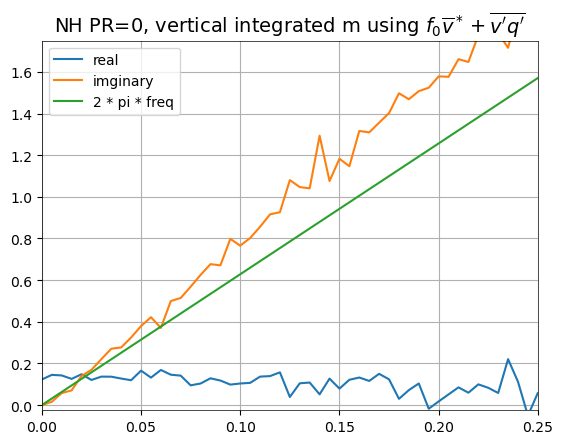

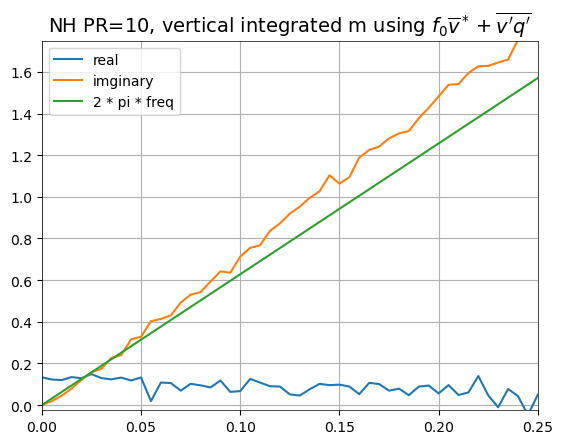

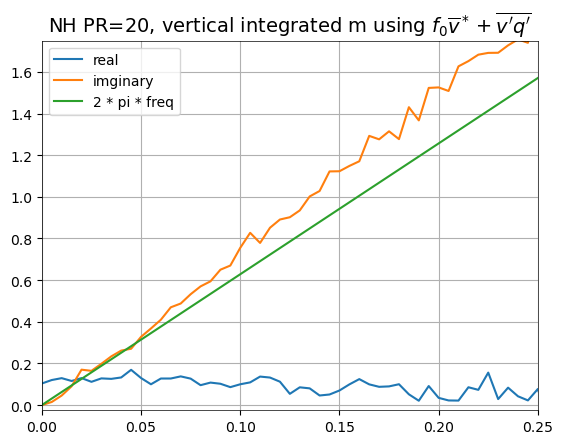

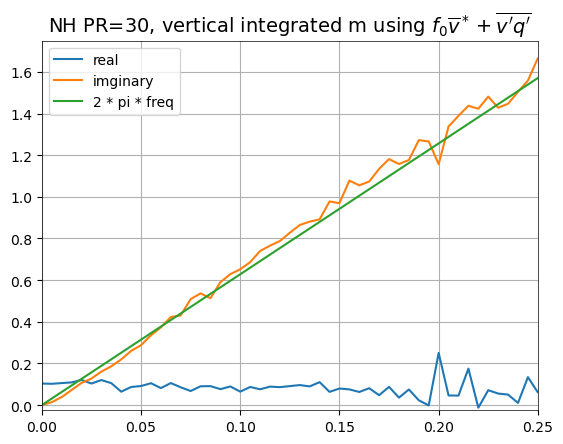

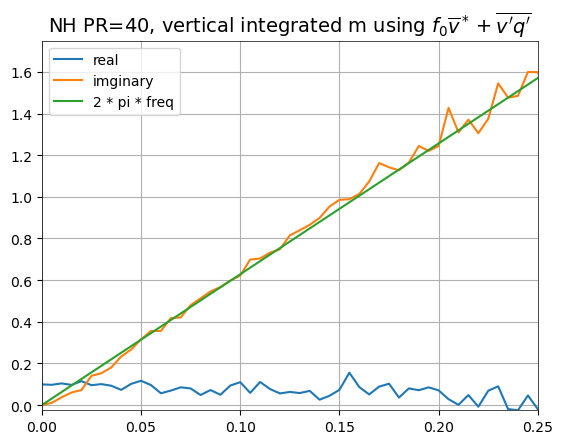

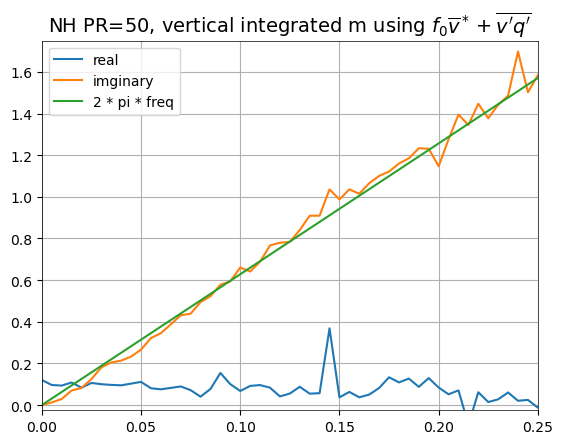

In [76]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] = f0v_star[a] + np.nanmean(vq_final[a], axis=1) 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $f_{0} \overline{v}^* + \overline{v'q'}$", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




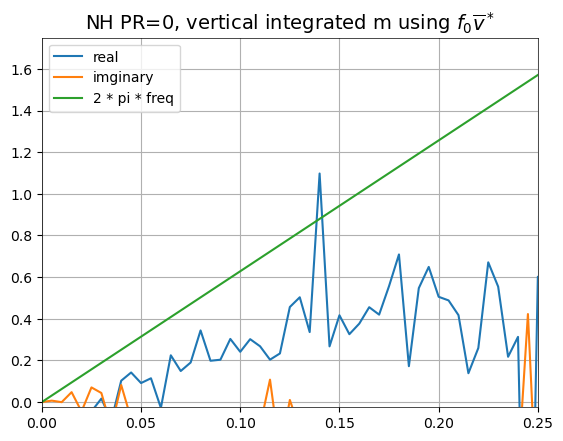

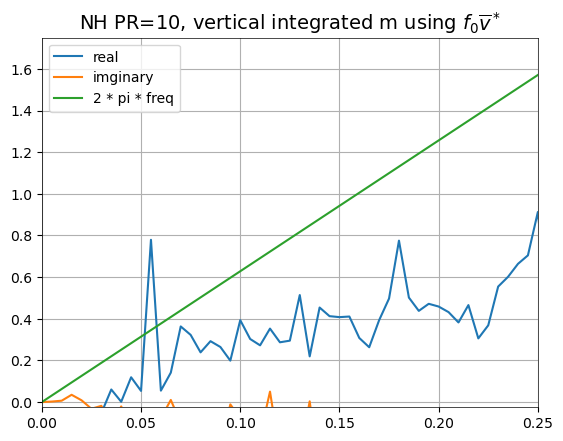

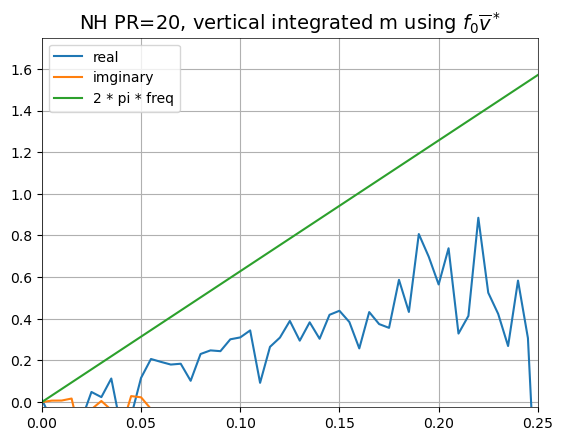

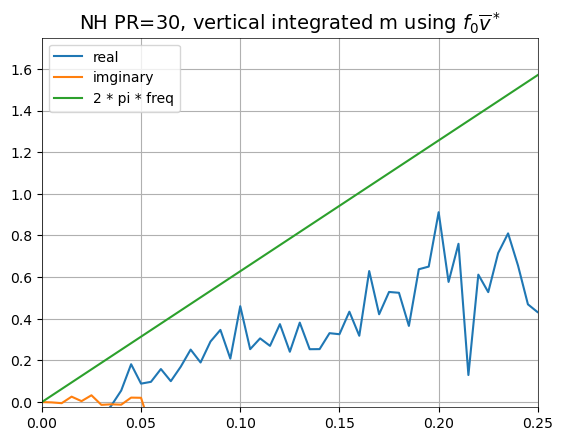

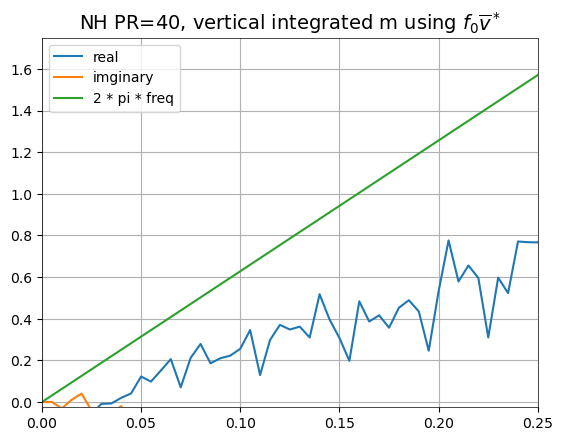

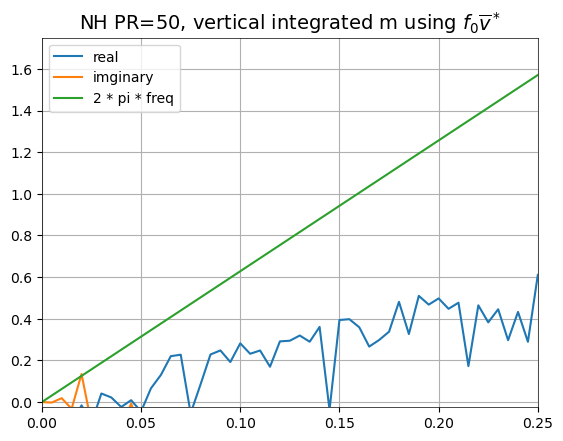

In [535]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] = f0v_star[a] #+ np.nanmean(vq_final[a], axis=1) 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $f_{0} \overline{v}^* $", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




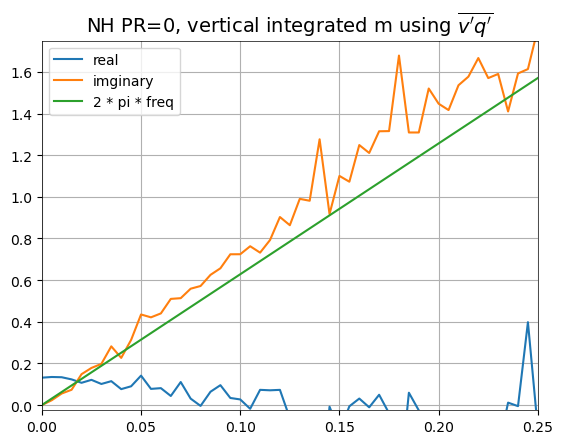

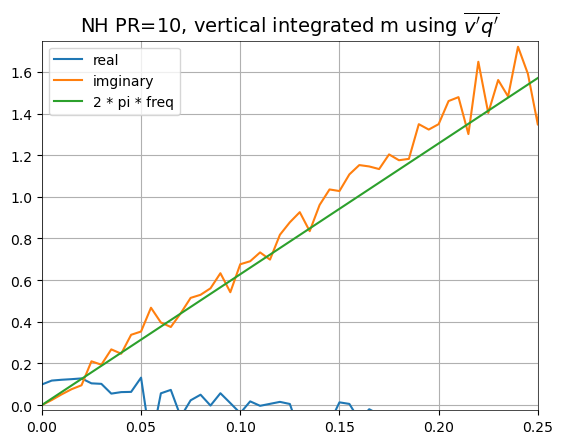

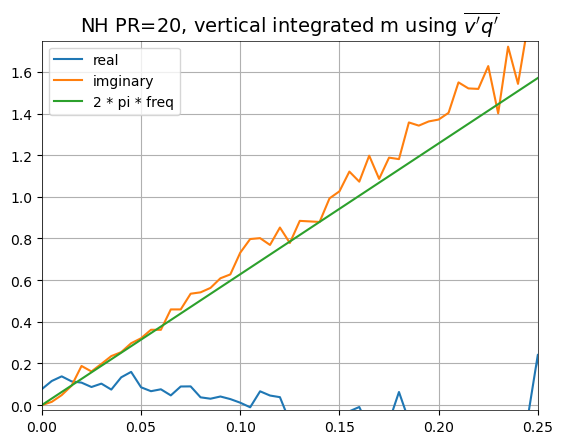

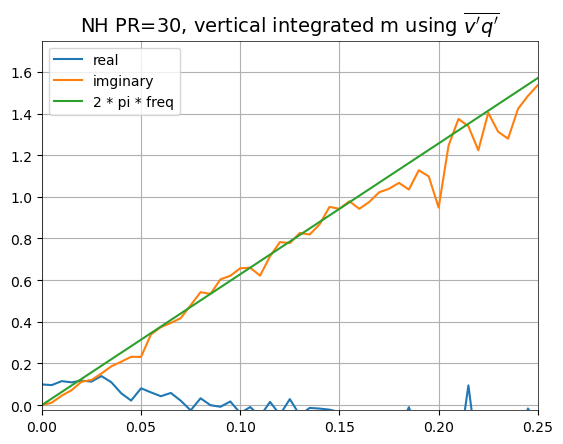

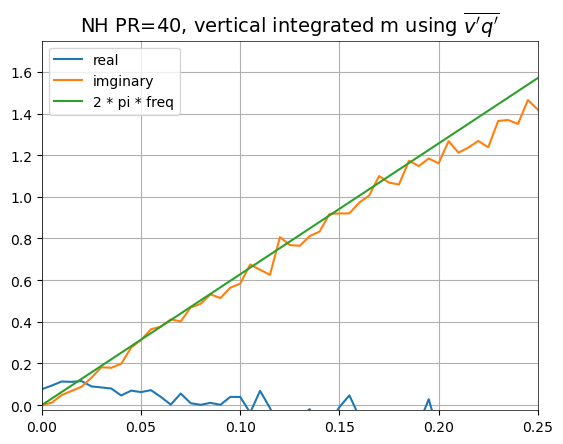

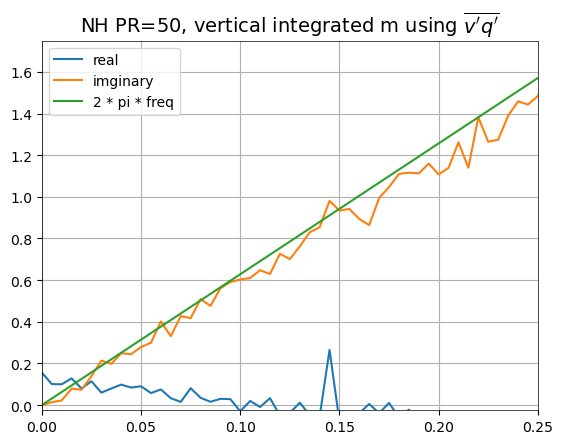

In [1042]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] =  np.nanmean(vq_final[a], axis=1) # f0v_star[a] + 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $\overline{v'q'}$", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




# test Fig.3 

(6, 19500, 20, 32)


(1.0, 0.0)

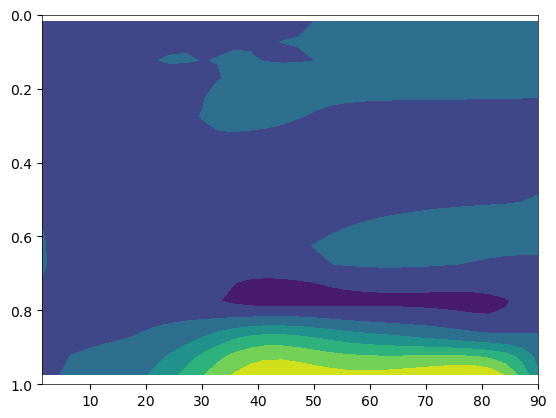

In [536]:
plt.figure()
print(vq_final.shape)
plt.contourf(yy[:,32:], sigma_mean2[:,32:], vq_final[0].mean(axis=0))
plt.ylim([1,0])

In [537]:
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
# f0v_star_minus = np.zeros(f0v_star_reshape.shape)

for i in range(num_lat):
    f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration

LH01
Remember to * 2 pi
eddy feed back low freq 0.004 ~ 0.028
PR=0, 1/tau =  75.64416513358213
PR=10, 1/tau =  85.52263873118544
PR=20, 1/tau =  84.56606805492025
PR=30, 1/tau =  72.65955462994341
PR=40, 1/tau =  76.92593608041729
PR=50, 1/tau =  87.52845260740888


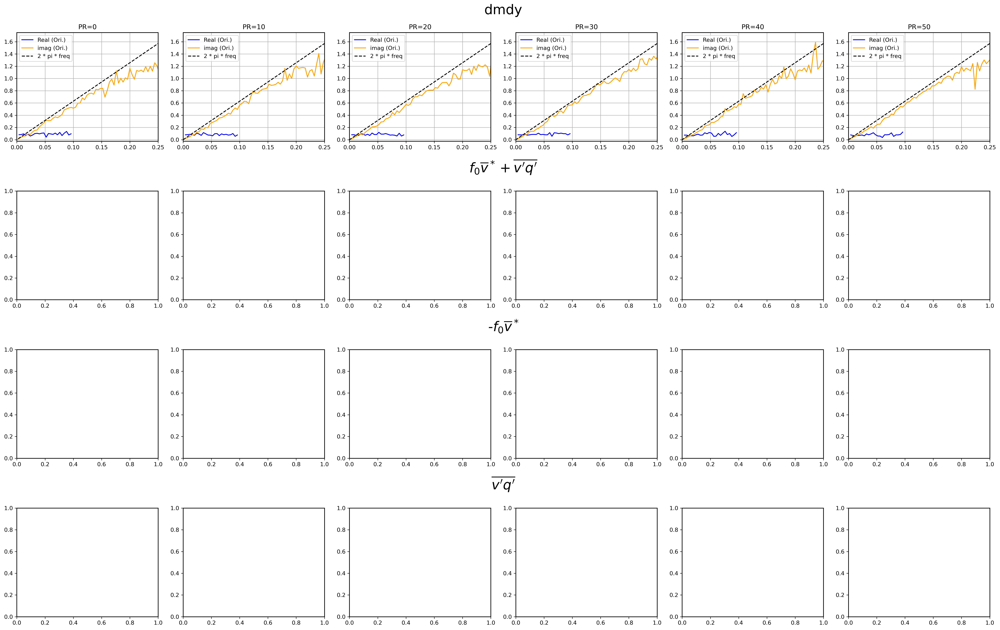

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fftfreq
from scipy.fft import fft, ifft, fftshift
# from numpy.fft import fft, fftfreq, hanning
# process fo v
num_exp = 6
num_lat = 32
z_final_for_MLclass = np.zeros((6,19500))
m_final_for_MLclass = np.zeros((6,19500))
day=19500

from matplotlib.gridspec import SubplotSpec
def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontsize=24)
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')
def process_wind_data(v_star, f0, num_lat, day):
    f0v_star = np.zeros((day, num_lat))
    for i in range(num_lat):
        f0v_star[:, i] = np.nanmean(v_star[:, :, i], axis=1) * f0[i + num_lat]
    return f0v_star
# Function to perform FFT and plot
def compute(a, u_50_w, m_right_current, title_suffix):
    """Compute EOF, FFT, and plot the results on given axes."""
    # u_normalized = (u_50[a] - np.nanmean(u_50[a])) / np.nanstd(u_50[a])

    single_EOF_50 = EOF((u_50[a,:,:] * cy[32:]**0.5,), n_components=num_lat, field="1D")
    single_EOF_50.get()

    z     = single_EOF_50.PC[0,:]
    EOFs  = single_EOF_50.EOF[0,:]
    z_std = z.std()
    
    z    /= z_std # no
    EOFs *= z_std # m/s

    m_right_current[a] *=  cy[32:]**0.5 # m^2 / s^2
    # m_right_current_new = (m_right_current[a] - m_right_current[a].mean()) / m_right_current[a].std()
    
    m = (m_right_current[a,:,:] ).dot(EOFs[:]) / EOFs[:].dot(EOFs[:].T)
    m_final = m    #/ m.std() # / np.dot(EOF_try, EOF_try.T)**0.5 #* z.std()
    z_final = z    #* m.std() #/ z.std() # / np.dot(EOF_try, EOF_try.T)**0.5 #/ z.std()

    # FFT computation setup
    lg = 250
    overlap = 125
    N  = lg
    final_all = np.zeros(N, dtype=complex)
    n_segments = 0
    hanning_window = np.hanning(lg)

    test = np.fft.fftfreq(250, 1)
    freq_shiht =  fftshift(test)
    
    for i in range(0, len(z) - lg + 1, lg - overlap):
        Z_segment = (fft(z_final[i:i+lg] )) #/ len(z_paper_final[i:i+lg])
        M_segment = (fft(m_final[i:i+lg] ))       #/ len(m_final[i:i+lg])
        
        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final = (M_segment * Z_star) / (Z_star * Z_segment) 
        final_all += final
        n_segments += 1
        
    final_all /=  n_segments 
    final_all_shift = fftshift(final_all)    

    return freq_shiht, final_all_shift
    
def pplot(freq_shiht, final_all_shift, slope, ax):
    if np.array(slope).any() == 0:
        # slope = 1/ np.nanmean(final_all_shift.imag[130]+final_all_shift.imag[129]+final_all_shift.imag[131]) * np.nanmean(freq_shiht[130]+freq_shiht[129]+freq_shiht[131])* 2 * np.pi
        slope_lf = np.polyfit(freq_shiht[126:128], final_all_shift.imag[126:128], 1) 
        slope_hf = np.polyfit(freq_shiht[131:190], final_all_shift.imag[131:190], 1) 

        
        
        ### Original data ###
        ax.plot(freq_shiht[126:150], final_all_shift.real[126:150]*86400 , label="Real (Ori.)", color="Blue")
        ax.plot(freq_shiht, final_all_shift.imag*86400 , label="imag (Ori.)", color="Orange")
        ax.plot(freq_shiht, freq_shiht * 2 * np.pi, '--', label="2 * pi * freq", color="black")
        #####################
        ### Adjust inside ###
        slope_2pi = np.polyfit(freq_shiht[126:132], freq_shiht[126:132] * 2* np.pi, 1) 

        #####################
        slope_Nick = np.polyfit(freq_shiht[126:150], final_all_shift.imag[126:150], 1) 
        # print("2pi/slope:", 2 * np.pi / (slope_Nick[0] * 86400) )
        ax.set_xlim([0, 0.25])
        ax.set_ylim([-0.025,1.75])
        ax.set_title(f"PR={a*10}", fontsize=12)
        ax.grid()
        ax.legend()

        return slope_lf, slope_hf, slope_2pi, slope_Nick
    else:        
        ### Original data ###
        ax.plot(freq_shiht, final_all_shift.real*86400 , label="Real (Ori.)", color="Blue")
        ax.plot(freq_shiht, final_all_shift.imag*86400 , label="imag (Ori.)", color="Orange")
        ax.plot(freq_shiht, freq_shiht * 2 * np.pi, '--', label="2 * pi * freq", color="black")
        
        # ax.set_xlim([0, 0.25])
        # ax.set_ylim([-0.025,1.75])
        ax.set_title(f"PR={a*10}", fontsize=12)
        ax.grid()
        ax.legend()
        return _
        
    

# Plot setup
m_right = np.zeros(((num_exp, day, num_lat)))

fig, ax = plt.subplots(4, 6, figsize=(25, 16), dpi=300)
# u_50   = Uzm[:,:,:,32:] # dycore.getVar("grid_u_c_xyzt")

f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
# f0v_star_minus = np.zeros(f0v_star_reshape.shape)
cy = np.cos(np.deg2rad(y))

kkk = np.zeros(6)
for a in range(num_exp):
    # Update u_50_w with cy correction
    u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2)
    u_50_w  = np.zeros(u_50.shape)
    
    for i in range(num_lat): # Assuming cy[0] and [-1] are np.nan
        # print(i+num_lat)
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    # First type - only dmdy
    m_right[a] =   np.nanmean(dmdy[a,:,:,32:], axis=1) 
    freq_shiht, final_all_shift_dmdy = compute(a, u_50_w, m_right, "dmdy") 
    slope_lf, slope_hf, slope_2pi, slope_Nick = pplot(freq_shiht, final_all_shift_dmdy, int(0), ax[0, a])
    
    # # Second type - f0v_star + mean(vq_final) 
    # for i in range(num_lat):
    #     f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    # m_right[a] =   f0v_star[a] + np.nanmean(vq_final[a], axis=1) 
    # freq_shiht, final_all_shift_star = compute(a, u_50_w, m_right, "f0v_star + mean(vq_final)")
    # _ = pplot(freq_shiht, final_all_shift_star, int(0), ax[1, a])

    # # Third type - only -f0v_star
    # v_star_vi = np.nanmean(v_star[:,:,:,:], axis=2)
    # f0v_star = np.zeros(((num_exp, day, num_lat)))
    # for i in range(num_lat):
    #     f0v_star[a,:,i] = v_star_vi[a,:,i] * f0[i+num_lat]
    # m_right[a] = -f0v_star[a]
    # freq_shiht, final_all_shift_f0star = compute(a, u_50_w, m_right, "-f0v_star")
    # _ = pplot(freq_shiht, final_all_shift_f0star, int(0), ax[2, a])

    # # Fourth type - only mean(vq_final)
    # m_right[a] = np.nanmean(vq_final[a], axis=1)
    # freq_shiht, final_all_shift_vq = compute(a, u_50_w, m_right, "mean(vq_final)")
    # _ = pplot(freq_shiht, final_all_shift_vq, int(0), ax[3, a])

    ### Check on 1/tau
    if a == 0:
        print("LH01")
        print("Remember to * 2 pi")
        print(f"eddy feed back low freq {freq_shiht[126]} ~ {freq_shiht[132]}")
        
    print(f"PR={a*10}, 1/tau = ", 1/ (np.mean(final_all_shift_dmdy.real[126:150]) / 2 / np.pi * 86400)  *  slope_2pi[0] / (slope_Nick[0] * 86400) ) 
    kkk[a] = 1/ (np.median(final_all_shift_dmdy.real[126:150]) / 2 / np.pi * 86400)  *  2 * np.pi / (slope_Nick[0] * 86400)
# title    
rows = 4
cols = 6

# for i, ax in enumerate(ax.flatten()):
    # ax.set_title(f'PR={i//6}')

grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], "dmdy")
create_subtitle(fig, grid[1, ::], "$f_{0} \overline{v}^* + \overline{v'q'}$ ")

create_subtitle(fig, grid[2, ::], r"-$f_{0} \overline{v}^* $")
create_subtitle(fig, grid[3, ::], r"$\overline{v'q'}$")
fig.tight_layout()
fig.set_facecolor('w')

plt.tight_layout()
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig3.png", bbox_inches='tight', dpi=600.)
plt.show()



Text(0.5, 1.0, '1/tau by LH01')

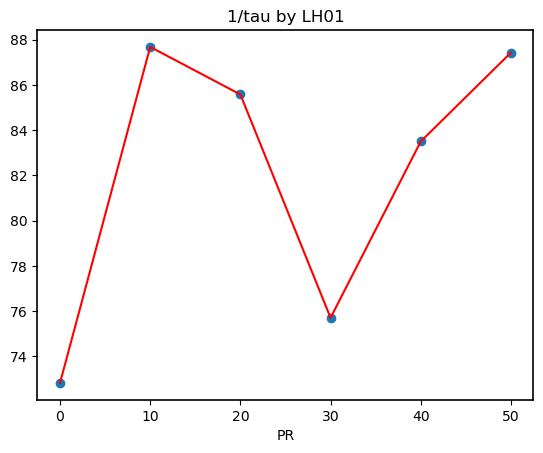

In [53]:
# print( 1/np.mean(final_all_shift_dmdy[160:190].real*86400) * 2 * np.pi)
plt.figure()
plt.scatter(np.arange(0,60,10), kkk)
plt.plot(np.arange(0,60,10), kkk, "Red")
plt.xlabel("PR")
plt.title("1/tau by LH01")

In [54]:
print(freq_shiht[126:])
print(freq_shiht[126:132])


[0.004 0.008 0.012 0.016 0.02  0.024 0.028 0.032 0.036 0.04  0.044 0.048
 0.052 0.056 0.06  0.064 0.068 0.072 0.076 0.08  0.084 0.088 0.092 0.096
 0.1   0.104 0.108 0.112 0.116 0.12  0.124 0.128 0.132 0.136 0.14  0.144
 0.148 0.152 0.156 0.16  0.164 0.168 0.172 0.176 0.18  0.184 0.188 0.192
 0.196 0.2   0.204 0.208 0.212 0.216 0.22  0.224 0.228 0.232 0.236 0.24
 0.244 0.248 0.252 0.256 0.26  0.264 0.268 0.272 0.276 0.28  0.284 0.288
 0.292 0.296 0.3   0.304 0.308 0.312 0.316 0.32  0.324 0.328 0.332 0.336
 0.34  0.344 0.348 0.352 0.356 0.36  0.364 0.368 0.372 0.376 0.38  0.384
 0.388 0.392 0.396 0.4   0.404 0.408 0.412 0.416 0.42  0.424 0.428 0.432
 0.436 0.44  0.444 0.448 0.452 0.456 0.46  0.464 0.468 0.472 0.476 0.48
 0.484 0.488 0.492 0.496]
[0.004 0.008 0.012 0.016 0.02  0.024]


[6.08461511e-05 3.48065793e-07]
[6.08461511e-05 3.48065793e-07]


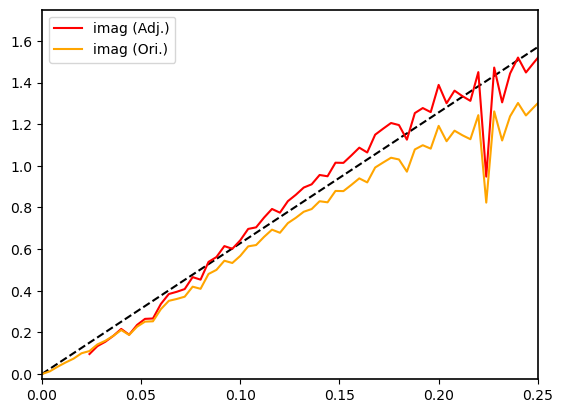

In [55]:
plt.figure()
plt.plot(freq_shiht[125:], freq_shiht[125:] * 2 * np.pi, 'k--')
# plt.scatter(freq_shiht[126:132], final_all_shift[126:132].imag * 86400)
# plt.plot(freq_shiht[126:132], (slope_lf[0] * freq_shiht[126:132] + slope_lf[1]) * 86400, lw=2, color="red")

# # # plt.figure()
# plt.scatter(freq_shiht[132:200], final_all_shift_dmdy[132:200].imag* 86400, color="Red")
# plt.plot(freq_shiht[132:200], (slope_hf[0] * freq_shiht[132:200] + slope_hf[1]) * 86400, lw=2, color="Red")

# plt.scatter(freq_shiht[132:200], ((final_all_shift_dmdy[132:200].imag - slope_hf[1] )/ slope_hf[0] * slope_lf[0] + slope_hf[1]) * 86400, color='Green')
# plt.plot(freq_shiht[132:200], (slope_lf[0] * freq_shiht[132:200] + slope_lf[1])*86400, lw=2, color="Green")
plt.plot(freq_shiht[131:200], (final_all_shift_dmdy.imag[131:200]  -  slope_hf[1]) / slope_hf[0] * slope_2pi[0] , label="imag (Adj.)", color="Red")
plt.plot(freq_shiht, final_all_shift_dmdy.imag*86400 , label="imag (Ori.)", color="Orange")
plt.xlim([0, 0.25])
plt.ylim([-0.025,1.75])
plt.legend()

print(slope_hf)
print(slope_hf)


In [812]:
print(freq_shiht[126:132])

print(final_all_shift[126:132].imag)

[0.004 0.008 0.012 0.016 0.02  0.024]
[-1.59522720e-07  2.94364038e-07  5.15687083e-07  7.62469937e-07
  1.06423350e-06  1.18807425e-06]


In [458]:
print(Vzm.shape)
print(np.sum(Vzm[-1,:,:,10], axis=(0,1)))

(6, 19500, 20, 64)
-7027.276516424971


Text(0.5, 1.0, 'EMF divergence')

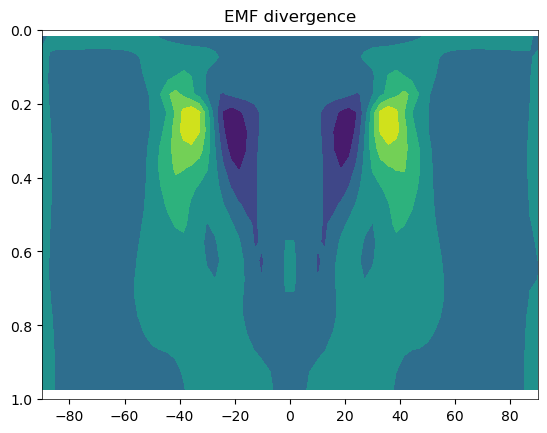

In [407]:
plt.figure()
plt.contourf(yy, sigma_mean2, dmdy[0].mean(axis=0))
plt.ylim([1,0])
plt.title("EMF divergence")

Text(0.5, 1.0, 'vq_final')

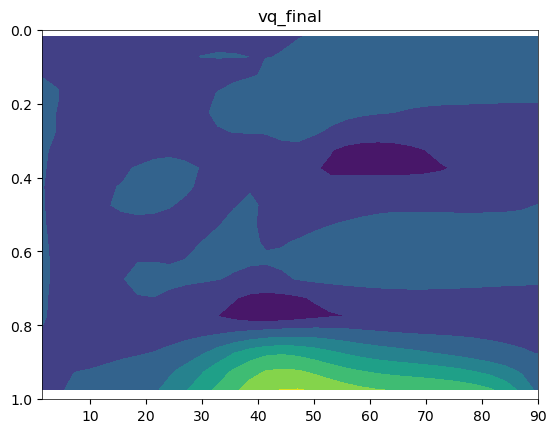

In [540]:
vq_final.shape
plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], vq_final[-1].mean(axis=0))
plt.ylim([1,0])
plt.title("vq_final")

In [541]:
# with h5py.File('PR0_50_500_20000day_z_final_for_MLclass.h5','w') as z_final_for_MLclass_file :
#     z_final_for_MLclass_file.create_dataset('z_final',data=z_final_for_MLclass)

# z_final_file      = h5py.File("PR0_50_500_20000day_z_final_for_MLclass.h5", "r")
# z_final_test     = np.asarray(z_final_file["z_final"][:,:])


In [542]:
# with h5py.File('PR0_50_500_20000day_m_final_for_MLclass.h5','w') as m_final_for_MLclass_file :
#     m_final_for_MLclass_file.create_dataset('m_final',data=m_final_for_MLclass)

# z_final_file      = h5py.File("PR0_50_500_20000day_z_final_for_MLclass.h5", "r")
# z_final_test     = np.asarray(z_final_file["z_final"][:,:])


# Fig.4 $\alpha = \gamma + {1 \over \tau} $
### eddy(m) influences mean flow(z) : <center>${d z \over d t}$ = m - $z \over \tau$ ... (1)<center>
### mean flow(z) influences eddy(m) : <center>${m = \gamma z + \hat{m}}$ ... (2) <center>
### eq(2) pluge in eq(1): <center>${d z \over d t}$ = $\gamma z + \hat{m}$- $z \over \tau$ ... (3)<center>
### To solve eq(3) simple type of linear ODE:
### <center> ${dz \over dt} = (\gamma - {1 \over \tau})z = \hat{m}$ <center>
### <center> ${dz \over dt}$ $e^{-\int (\gamma - {1 \over \tau})}$ - $(\gamma - {1 \over \tau})$ $e^{-\int (\gamma - {1 \over \tau})}$ z = $\hat{m}$$e^{-\int (\gamma - {1 \over \tau})}$<center>
### <center>=> (z$e^{-(\gamma - {1 \over \tau})t}$)' = $\hat{m}$ $e^{-(\gamma - {1 \over \tau})t}$<center>
### <center>=> z$e^{-(\gamma - {1 \over \tau})t}$ = $\int\hat{m}$ $e^{-(\gamma - {1 \over \tau})t} dt$ + C<center>
### <center>=> z = $e^{-(\gamma - {1 \over \tau})t}$$\int\hat{m}$ $e^{-(\gamma - {1 \over \tau})t} dt$ + $z_{0}$ $e^{(\gamma - {1 \over \tau})t} $<center>

(6, 19500, 20, 64)


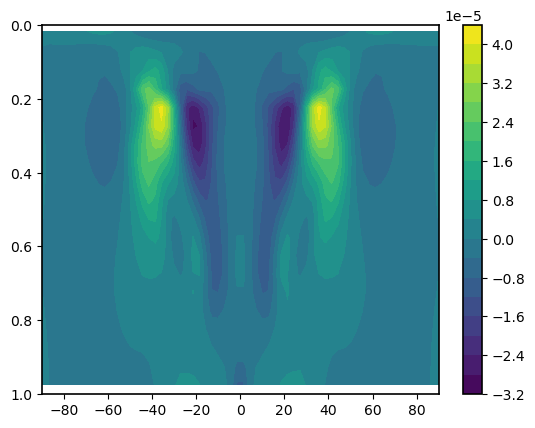

In [124]:
radius  = 6.37122e6
y = np.linspace(-90,90,64)
yd = np.deg2rad(y)
cy = np.cos(yd)
cy2 = cy **2

dmdy = np.zeros((((6, 19500, 20, 64))))
for a in range(6):
    Mzm = EMF_oringin_grid[a]
    # for i in range(1,64-1):
    #     Mzm[:,:,i] = cy[i]**0.5 * Mzm[:,:,i]
    
    for i in range(1,64-1):
        dmdy[a,:,:,i] = -(Mzm[:,:,i+1] * (cy[i]**2) - Mzm[:,:,i-1]* (cy[i]**2)) / (radius * (cy[i]**2) * (yd[i+1] - yd[i-1]))
    # dmdy[a,:,:,1:-1] = -((Mzm[:,:,2:] - Mzm[:,:,:-2]) * cy2[1:-1]) / (radius * (cy2[1:-1]) * (yd[2:] - yd[:-2]))
    
    dmdy[a,:,:, 0] = -((Mzm[:,:, 1] - Mzm[:,:, 0]) * cy2[0])  / (radius* cy2[0]  *(yd[ 1] - yd[ 0]))
    dmdy[a,:,:,-1] = -((Mzm[:,:,-1] - Mzm[:,:,-2]) * cy2[-1]) / (radius* cy2[-1] *(yd[-1] - yd[-2]))
print(dmdy.shape)
################################
plt.figure()
plt.contourf(yy, sigma_mean2, (dmdy[0]).mean(axis=0), levels=21)
plt.ylim([1,0])
plt.colorbar()

(99.9797073187697+0j) 97.13137131943957
$τ_{z}^2$: (158.74260823630723-4.965824021015854e-16j)
(84.70843718536447+0j) 85.87613231449768
$τ_{z}^2$: (153.37735945886757-8.584305953355103e-16j)
(91.56479039982605+0j) 90.65532837824371
$τ_{z}^2$: (172.58603867992895+1.6464689082580238e-15j)
(78.20197295810921+0j) 75.45137231014692
$τ_{z}^2$: (172.56881773397222-3.1919754643740533e-16j)
(74.87186092929242+0j) 73.18384660745436
$τ_{z}^2$: (182.52449663270326+1.7936368427692468e-15j)
(68.1286246538962+0j) 68.09973375898875
$τ_{z}^2$: (186.78407928519172-6.304504871470285e-16j)


/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/work/b08209033/miniconda3/envs/ML/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/tmp/ipykernel_2620556/1055527523.py:73: ComplexWarning: Casting complex values to real discards the imaginary part
  tau_z_square[aa] = ((Pz_all/ Pm_all)[idx]/86400**2)[lg//2:lg//2+10].max()


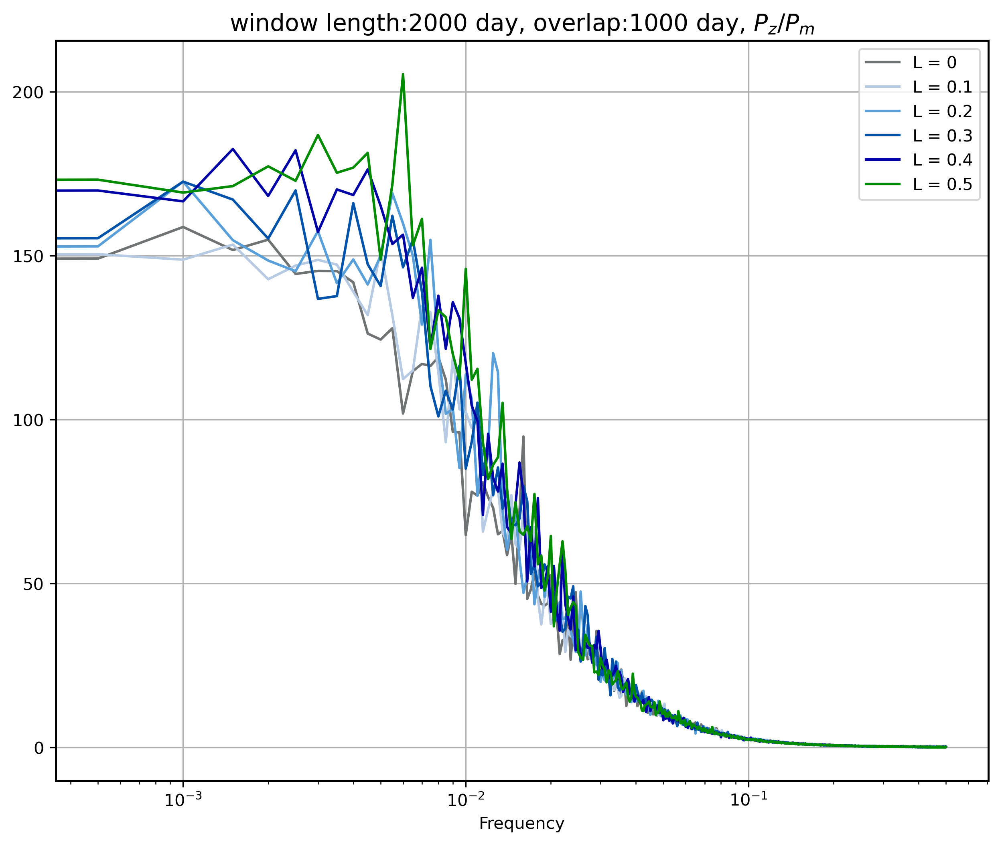

In [170]:
num_exp = 6
EMF_w = np.zeros(dmdy.shape)
PP_all_u = np.zeros((6,19500))
m_fig3 = np.zeros((6, 19500))
for a in range(num_exp):
    u_50_w[a,:,:] = u_50[a,:,:] * (cy[num_lat:])**0.5
    single_EOF_u  = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    
    single_EOF_u.get()
    
    z_u       = (single_EOF_u.PC[0,:])
    EOF_u     = (single_EOF_u.EOF[0,:])

    EOF_u_final   = EOF_u #/ EOF_u.std() # no unit

    PP_all_u[a,:] = z_u   #* EOF_u.std() # m/s

    m_fig3[a] = np.dot(np.nanmean(dmdy[a,:,:,32:]* (cy[num_lat:])**0.5, axis=1), EOF_u_final[:]) # m/s^2

##########################################################################################################
tau_z_square = np.zeros(6)

plt.figure(figsize=(10,8), dpi=300.)
plt.xscale("log")

# Apply FFT to each window
lg      = 2000 # length of the interval
overlap = 1000 # overlap
final  = 0
Pz_all = 0
Pm_all = 0
for aa in range(0,6):
        test = 0
    
        m_final       = m_fig3[aa]   # m/s^2
        z_paper_final = PP_all_u[aa] # m/s    
    
        final_all  = np.zeros(lg, dtype=complex)
        n_segments = 0  # Keep track of the number of segments processed
        for i in range(0, len(z_paper_final) - lg + 1, lg - overlap):
            hanning_window = np.hanning(lg)
            Z_segment = fft(z_paper_final[i:i+lg] ) / len(hanning_window)
            M_segment = fft(m_final[i:i+lg] )       / len(hanning_window)
    
            M_star = np.conjugate(M_segment)
            Z_star = np.conjugate(Z_segment)

            Pz = Z_segment * Z_star
            Pm = M_segment * M_star
            
            # Compute the cross-spectrum
            Pz_all += Pz
            Pm_all += Pm

            test += (Z_segment).dot(np.conjugate(Z_segment).T) #/ len(hanning_window)
            n_segments += 1
        
        Pz_all /= n_segments
        Pm_all /= n_segments

        print(test/n_segments, np.var(z_paper_final))

        
        # Compute the frequencies for plotting
        freq = fftfreq(lg, d=1)  # Assuming your time unit is days
        idx = np.argsort(freq)
        if aa ==0:
            plt.plot(freq[idx], ((Pz_all/ Pm_all)[idx]/ (86400**2)), label=f"L = {0}", color=colors[int(aa)])
        else:
            plt.plot(freq[idx], ((Pz_all/ Pm_all)[idx]/ (86400**2)), label=f"L = {round(aa*0.1,1)}", color=colors[int(aa)])
    
        print("$\u03C4_{z}^2$:", ((Pz_all/ Pm_all)[idx]/86400**2)[lg//2:lg//2+10].max())
        tau_z_square[aa] = ((Pz_all/ Pm_all)[idx]/86400**2)[lg//2:lg//2+10].max()
        
plt.xlabel("Frequency")
plt.title(f"window length:{lg} day, overlap:{overlap} day, $P_z / P_m$", fontsize=14)
plt.legend()
plt.grid()
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig3a.png", bbox_inches='tight', dpi=600.)
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar/fig3a.png", bbox_inches='tight', dpi=600.)

plt.show()

# plt.figure()
# plt.xscale("log")
# plt.plot(freq[idx], (Pm_all)[idx]* (86400**2), label=f"PR={aa*10}", color=colors[int(aa)], )
# plt.title("window length:1000 day, overlap:500 day, $P_\mu$", fontsize=14)
# plt.ylim([0,0.2])

In [66]:
print(tau_z_square)


[158.74260824 153.37735946 172.58603868 172.56881773 182.52449663
 186.78407929]


In [171]:
# PR=0, 1/tau= 79.78373987669606
# PR=10, 1/tau= 66.28407748836575
# PR=20, 1/tau= 58.66344874247876
# PR=30, 1/tau= 58.20717669940184
# PR=40, 1/tau= 50.31451704233443
# PR=50, 1/tau= 54.59737871990912
alpha = np.zeros(6)
alpha[0] = 79.78373987669606
alpha[1] = 66.28407748836575
alpha[2] = 58.66344874247876
alpha[3] = 58.20717669940184
alpha[4] = 50.31451704233443
alpha[5] = 54.59737871990912


$dlog(C_{z_{1}z_{1}}) / d\tau$\n
eddy feed back 60~66day
L=0, 1/tau= 79.78373987669603
L=10, 1/tau= 66.28407748836575
L=20, 1/tau= 58.66344874247876
L=30, 1/tau= 58.207176699401856
L=40, 1/tau= 50.31451704233443
L=50, 1/tau= 54.597378719909116


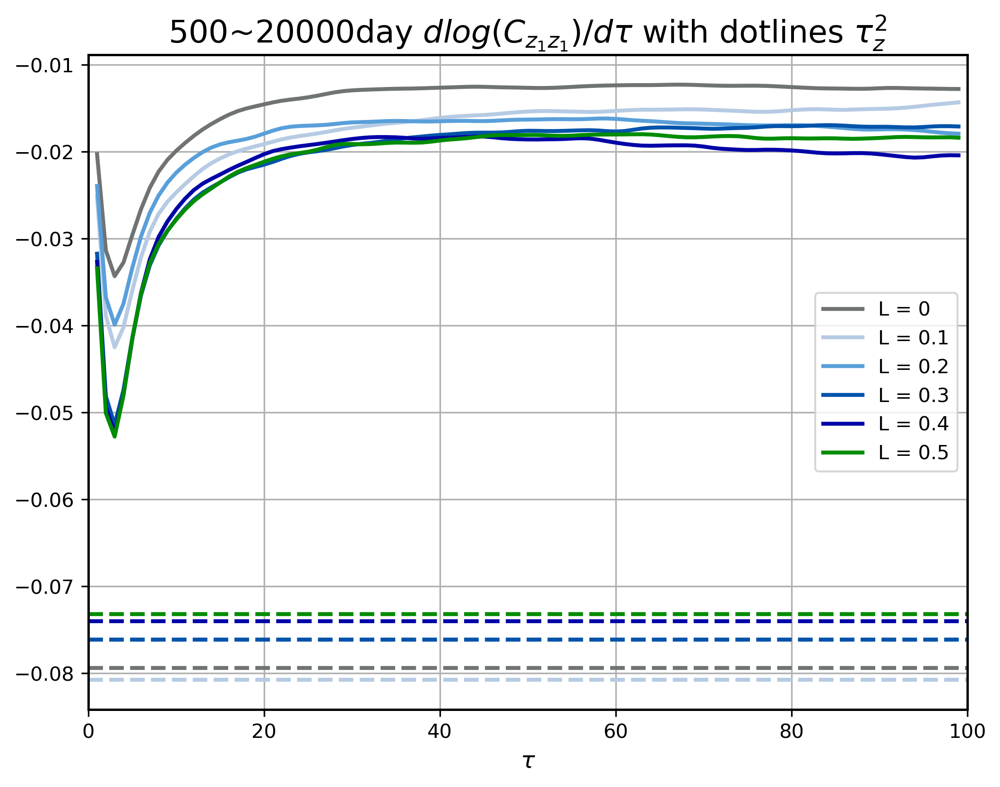

[ 0.         -0.02027581 -0.03134219 -0.03430505 -0.03274543 -0.02960664
 -0.02659974 -0.02414534 -0.02228271 -0.02093159 -0.01989078 -0.01899672
 -0.0181767  -0.01744082 -0.01680594 -0.01623958 -0.01573193 -0.01531947
 -0.01501447 -0.01477212 -0.01454384 -0.01431816 -0.01413025 -0.01399559
 -0.01387956 -0.01373613 -0.01356071 -0.01335983 -0.01316818 -0.01302603
 -0.01293721 -0.01288185 -0.01284237 -0.01280992 -0.01277677 -0.01274926
 -0.01273591 -0.01272068 -0.01269305 -0.01265941 -0.01262755 -0.01259859
 -0.01256356 -0.01252798 -0.01251313 -0.01252825 -0.01255906 -0.01258463
 -0.01260133 -0.01261847 -0.01264309 -0.01266441 -0.01266235 -0.01263549
 -0.01259336 -0.01253949 -0.01248444 -0.01243888 -0.01240345 -0.01237725
 -0.01235857 -0.01234188 -0.01233085 -0.01233036 -0.01232883 -0.01231238
 -0.01228991 -0.01227692 -0.01228295 -0.0123107  -0.01234557 -0.01237703
 -0.01240078 -0.01241031 -0.01240621 -0.01239832 -0.01239833 -0.01241774
 -0.01245631 -0.01250637 -0.01255729 -0.01260675 -0

In [202]:
plt.figure(figsize=(8,6), dpi=300)
total_pr = int(total_pr)
length = 100
total_L_final = np.zeros(total_pr)
total_L = np.zeros((total_pr,length))
aa  = 0
print(r"$dlog(C_{z_{1}z_{1}}) / d\tau$\n")
print("eddy feed back 60~66day")
for pr in range(pr_start, pr_to, pr_leap):
    for i in range(1,len(total_L[aa,:])):
        if aa == 0:
            total_L[aa,i]      = np.log(yyy_thin[i])/int(i)
        elif aa == 1:
            total_L[aa,i]      = np.log(yyy2_thin[i])/int(i)
        elif aa == 2:
            total_L[aa,i]      = np.log(yyy3_thin[i])/int(i)
        elif aa == 3:
            total_L[aa,i]      = np.log(yyy4_thin[i])/int(i)
        elif aa == 4:
            total_L[aa,i]      = np.log(yyy5_thin[i])/int(i)
        elif aa == 5:
            total_L[aa,i]      = np.log(yyy6_thin[i])/int(i)

        if i >= 60 and i <= 99:
            total_L_final[aa] += total_L[aa,i] 
    total_L_final[aa] /= 40 #len(total_L[aa,:])
    if aa ==0:
        plt.plot(tau[1:], total_L[aa,1:] , label=f"L = {0}", color=colors[int(pr/pr_leap)], lw=2)
    else:
        plt.plot(tau[1:], total_L[aa,1:] , label=f"L = {round(aa*0.1,1)}", color=colors[int(pr/pr_leap)], lw=2)
    # print(f"PR={aa*10},a=", np.exp(total_L_final[aa]),"1/tau=", -1/(total_L_final[aa]) )
    print(f"L={aa*10}, 1/tau=", -1/(total_L_final[aa]) )

    plt.axhline(y = -1/(tau_z_square[aa]**0.5), linestyle="--", color=colors[int(pr/pr_leap)], lw=2)
    
    
    aa += 1
plt.title(f"{start}~{end}day" + r" $dlog(C_{z_{1}z_{1}}) / d\tau$ with dotlines $\tau_{z}^2$", fontsize=16)

plt.xlabel(r"$\tau $", fontsize=12)
# plt.xticks(np.arange(0,length-1), np.arange(1,length), fontsize=12)
plt.xlim([0,100])
plt.grid()
plt.legend()

# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig3b_dCz1z1dtau with dotlines $\tau_{z}^2$.png", bbox_inches='tight', dpi=600.)
plt.show()

print(total_L[0])
print(total_L_final[0])



In [196]:
tau_z_square.shape

(6,)

In [197]:
aa = 0
fig4_final = np.zeros(6)
fig4_for_eb = np.zeros((6, 59))
for pr in range(pr_start, pr_to, pr_leap):
    fig4_final[aa]  = np.median(total_L[aa,40:99]) - (-1/tau_z_square[aa]**0.5)
    fig4_for_eb[aa] = total_L[aa,40:99] - (-1/tau_z_square[aa]**0.5)
    print(aa)
    aa += 1

0
1
2
3
4
5


In [198]:
fig4_for_eb[0,:].std()

0.00015199614551861766

Text(0.5, 0, 'L')

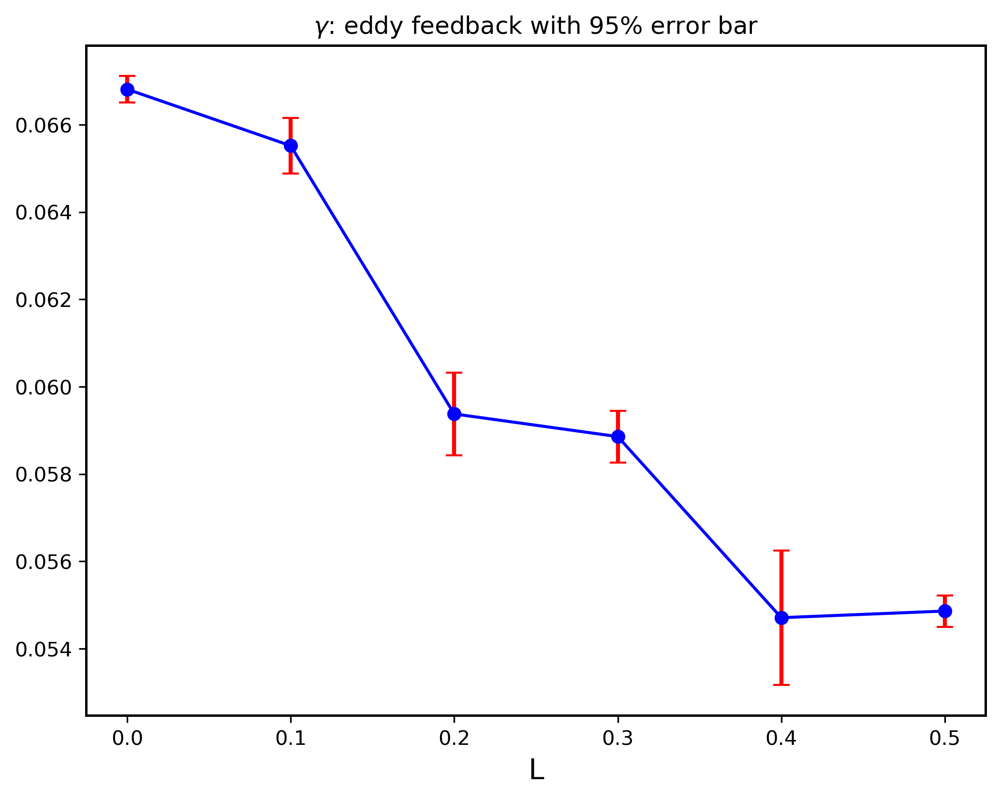

In [199]:
xxx = np.arange(0,0.6,0.1)
plt.figure(figsize=(8,6), dpi=300.)
plt.errorbar(xxx, fig4_final, 2*np.std(fig4_for_eb[:,:], axis=1), fmt='-o', ecolor='r', color='b', elinewidth=2, capsize=4)
plt.title("$\gamma$: eddy feedback with 95% error bar")
plt.xlabel("L", fontsize=14)
# plt.yticks(np.arange(0.055, 0.070, 0.005))
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig4 eddy feedback.png", bbox_inches='tight', dpi=600.)
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig_Nick_colorbar/fig4 eddy feedback.png", bbox_inches='tight', dpi=600.)


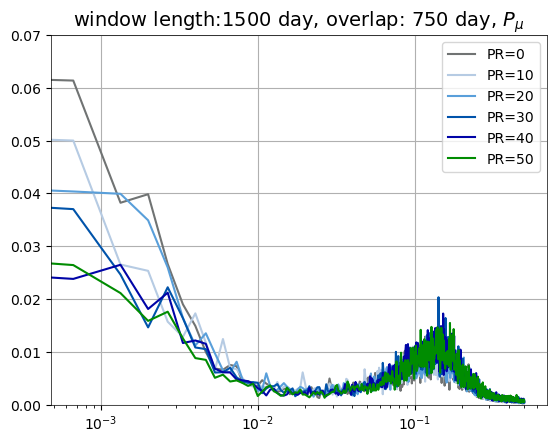

In [1812]:
EMF_w = np.zeros(dmdy.shape)
PP_all_u = np.zeros((6,19500))
m_fig3 = np.zeros((6, 19500))
for a in range(num_exp):
    u_50_w[a,:,:] = u_50[a,:,:] * (cy[num_lat:])**0.5
    single_EOF_u  = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    
    single_EOF_u.get()
    
    z_u       = (single_EOF_u.PC[0,:])
    EOF_u     = (single_EOF_u.EOF[0,:])

    EOF_u_final   = EOF_u #/ EOF_u.std() # no unit

    PP_all_u[a,:] = z_u   #* EOF_u.std() # m/s

    m_fig3[a] = np.dot(np.nanmean(dmdy[a,:,:,32:]* (cy[num_lat:])**0.5, axis=1), EOF_u_final[:]) # m/s^2

##########################################################################################################
plt.figure()
plt.xscale("log")

# Apply FFT to each window
lg      = 1500 # length of the interval
overlap = 750 # overlap
final  = 0
Pz_all = 0
Pm_all = 0

for aa in range(0,6):
        m_final       = m_fig3[aa]   # m/s^2
        z_paper_final = PP_all_u[aa] # m/s    
    
        final_all  = np.zeros(lg, dtype=complex)
        n_segments = 0  # Keep track of the number of segments processed
        for i in range(0, len(z_paper_final) - lg + 1, lg - overlap):
            hanning_window = np.hanning(lg)
            Z_segment = fft(z_paper_final[i:i+lg] ) / len(hanning_window)
            M_segment = fft(m_final[i:i+lg] )       / len(hanning_window)
    
            M_star = np.conjugate(M_segment)
            Z_star = np.conjugate(Z_segment)

            Pz = Z_segment * Z_star
            Pm = M_segment * M_star
            
            # Compute the cross-spectrum
            Pz_all += Pz
            Pm_all += Pm
            
            n_segments += 1
        
        Pz_all /= n_segments
        Pm_all /= n_segments
    
        
        # Compute the frequencies for plotting
        freq = fftfreq(lg, d=1)  # Assuming your time unit is days
        idx = np.argsort(freq)
    
        # plt.plot(freq[idx], (Pz_all/ Pm_all)[idx]/ (86400**2), label=f"PR={aa*10}", color=colors[int(aa)], )

        plt.plot(freq[idx], (Pm_all.real)[idx]* (86400**2), label=f"PR={aa*10}", color=colors[int(aa)], )
plt.title(f"window length:{lg} day, overlap: {overlap} day, $P_\mu$", fontsize=14)
plt.ylim([0, 0.07])
plt.grid()
plt.legend()